In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import imager
from scipy.stats import multivariate_normal, norm
import cmocean.cm as cmo
from matplotlib import cm
import cycler
import matplotlib as mpl
import math
plt.get_cmap("Pastel1")
rgb_cmap = [plt.get_cmap("Pastel1").colors[i] for i in [2,1,0]]
bool_cmap = cycler.cycler('color', rgb_cmap)

from matplotlib.colors import ListedColormap, LinearSegmentedColormap

pastel = plt.get_cmap("Pastel1")
newcolors = pastel([1,2,0])
newcmp = ListedColormap(newcolors)
def hex_to_rgb(value):
    """Return (red, green, blue) for the color given as #rrggbb."""
    value = value.lstrip('#')
    lv = len(value)
    return[int(value[i:i + lv // 3], 16)/255 for i in range(0, lv, lv // 3)]

tab10=["#4E79A7", "#F28E2B", "#E15759", "#76B7B2", "#59A14F",
                 "#EDC948", "#B07AA1", "#FF9DA7", "#9C755F", "#BAB0AC"]

tab10_rgb = [hex_to_rgb(h) for h in tab10]

mpl.rcParams['axes.prop_cycle'] = cycler.cycler('color', tab10_rgb)
mpl.rcParams["legend.framealpha"] = 0
mpl.rcParams['font.size']=30

Using NumPy backend


In [3]:
dpi=150
mpl.rcParams['figure.dpi'] = dpi

In [4]:
import pathlib
import matplotlib.ticker
from matplotlib.ticker import FormatStrFormatter
from matplotlib.ticker import FuncFormatter
def draw_2D_img(
    scenario,
    srcs: list = None,
    saveimg=False,
    fname=None,
    cbar_label=r"Activity (Ci)",
    ax=None,
    return_figure=False,
    draw_img=True,
    draw_contour=False,
    contour_src=None,
    text=None,
    show_counts_cbar=True,
    show_act_cbar=True,
    show_img_label_tick=True,
    cbar_ticks = None,
    cbar_ticklabel=None,
#    show_cbar_label=True,
    **kwargs,
):
    if "dpi" in kwargs.keys():
        dpi = kwargs.pop("dpi")
    else:
        dpi = 400

    if "cmap" not in kwargs.keys():
        kwargs["cmap"] = "magma"
    alpha = kwargs.pop("alpha") if "alpha" in kwargs.keys() else 1
    if "figsize" in kwargs.keys():
        figsize = kwargs.pop("figsize")
        assert isinstance(figsize, tuple) and np.size(figsize) == 2
    else:
        x_extent = scenario.extent[0, 0] - scenario.extent[0, 1]
        y_extent = scenario.extent[1, 0] - scenario.extent[1, 1]
        figsize = (15, 15 * y_extent / x_extent)

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=figsize)

    ax.set_xlim((scenario.extent[0, 0], scenario.extent[0, 1]))
    ax.set_ylim((scenario.extent[1, 0], scenario.extent[1, 1]))

    if srcs is None:
        srcs = scenario.srcs

    dist_srcs = [s for s in srcs if isinstance(s, imager.source.DistributedSource)]

    if len(dist_srcs) > 0:
        dist_cbar = True
    else:
        dist_cbar = False
    point_label = False

    if len(dist_srcs) > 0:
        summed_src = sum(dist_srcs)

        src_map = ax.pcolormesh(
            scenario.X_bound[:, :, 0],
            scenario.Y_bound[:, :, 0],
            summed_src.src_dist.sum(axis=2),
            alpha=alpha,
            **kwargs,
        )

    counts_map = ax.quiver(
        scenario.path[:-1, 0],
        scenario.path[:-1, 1],
        scenario.path[1:, 0] - scenario.path[:-1, 0],
        scenario.path[1:, 1] - scenario.path[:-1, 1],
        scenario.counts.sum(axis=1)[:-1],
        cmap="coolwarm",
        width=0.005,
        scale=None,
        headwidth=1.5,
        alpha=0.8 * alpha,
    )
    ax.set_xlabel("x(m)")
    ax.set_ylabel("y(m)")
    ax.grid("on", ls="-.", alpha=0.7)
    if show_img_label_tick is False:
        xax = ax.axes.get_xaxis()
        xax = xax.set_visible(False)
        yax = ax.axes.get_yaxis()
        yax = yax.set_visible(False)
   
    # Colorbar format
    
    if dist_cbar is True:
        if show_act_cbar is True:
            fmt = FormatScalarFormatter(fformat='%.2f')
            cax_act = append_axes(ax, size=0.3, pad=0.1)
            act_cbar = plt.colorbar(
                src_map,
                cax=cax_act,
                orientation="vertical",
                format=fmt,
                ticks = cbar_ticks
            )
            if cbar_ticklabel is not None:
                act_cbar.ax.set_yticklabels(cbar_ticklabel)
            else:
                act_cbar.formatter.set_powerlimits((0, 0))
            act_cbar.ax.yaxis.set_offset_position("left")
            act_cbar.set_label(cbar_label)

    if show_counts_cbar is True:
        fmt = FormatScalarFormatter("%.1f")
        cax_count = append_axes(ax, size=0.3, pad=1.6)
        counts_cbar = plt.colorbar(
            counts_map, cax=cax_count, orientation="vertical", format=fmt
        )
        counts_cbar.ax.yaxis.set_offset_position("left")


        counts_cbar.formatter.set_powerlimits((0, 0))
        counts_cbar.set_label("Counts")

    if point_label is True:
        ax.legend()

    if draw_contour is True:
        assert contour_src is not None
        if len(contour_src.shape) == 3:
            contour_src = contour_src.sum(axis=2)
        mask = contour_src > 0
        lines = contour_rect_slow(mask, scenario.extent, scenario.vox_size)
        print(lines[1])
        for line in lines:
            ax.plot(line[1], line[0], linewidth=3, color="r")
    if text is not None:
        ax.annotate(
            text=text,
            xy=(0.02, 0.95),
            xycoords="axes fraction",
            color="white",
            fontsize=40,
        )
    if saveimg is True:
        assert fname is not None
        fpath = pathlib.Path(fname)
        path_dir = fpath.parent
        path_dir.mkdir(parents=True, exist_ok=True)
        fig.savefig(fname=str(fpath), dpi=dpi, bbox_inches="tight")
    if draw_img is True:
        plt.show()
    if return_figure is True:
        return fig
    
def append_axes(ax, size=0.1, pad=0.1, position="right", extend=False):
    fig = ax.figure
    bbox = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    width, height = bbox.width, bbox.height
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    from mpl_toolkits.axes_grid1 import axes_size
    divider = make_axes_locatable(ax)
    margin_size = axes_size.Fixed(size)
    pad_size = axes_size.Fixed(pad)
    xsizes = [pad_size, margin_size]
    if position in ["top", "bottom"]:
        xsizes = xsizes[::-1]
    yhax = divider.append_axes(position, size=margin_size, pad=pad_size)

    def extend_ratio(ax):
        ax.figure.canvas.draw()
        orig_size = ax.get_position().size
        new_size = 0
        for itax in ax.figure.axes:
            new_size += itax.get_position().size

        return new_size / orig_size

    if position in ["right"]:
        divider.set_horizontal([axes_size.Fixed(width)] + xsizes)
        fig.set_size_inches(
            fig.get_size_inches()[0] * extend_ratio(ax)[0], fig.get_size_inches()[1]
        )
    elif position in ["left"]:
        divider.set_horizontal(xsizes[::-1] + [axes_size.Fixed(width)])
        fig.set_size_inches(
            fig.get_size_inches()[0] * extend_ratio(ax)[0], fig.get_size_inches()[1]
        )
    elif position in ["top"]:
        divider.set_vertical([axes_size.Fixed(height)] + xsizes[::-1])
        fig.set_size_inches(
            fig.get_size_inches()[0], fig.get_size_inches()[1] * extend_ratio(ax)[1]
        )
    elif position in ["bottom"]:
        divider.set_vertical(xsizes + [axes_size.Fixed(height)])
        fig.set_size_inches(
            fig.get_size_inches()[0], fig.get_size_inches()[1] * extend_ratio(ax)[1]
        )

    return yhax

class FormatScalarFormatter(matplotlib.ticker.ScalarFormatter):
    def __init__(self, fformat="%1.1f", offset=True, mathText=True):

        matplotlib.ticker.ScalarFormatter.__init__(
            self, useOffset=offset, useMathText=mathText
        )
        self.format = "%.1f"
        
    def format_data(self, value):
        # docstring inherited
        e = math.floor(math.log10(abs(value)))
        s = round(value / 10**e, 10)
        exponent = self._format_maybe_minus_and_locale("%d", e)
        significand = self._format_maybe_minus_and_locale(
            "%d" if s % 1 == 0 else self.format, s)
        if e == 0:
            return significand
        elif self._useMathText or self._usetex:
            exponent = "10^{%s}" % exponent
            return (exponent if s == 1  # reformat 1x10^y as 10^y
                    else rf"{significand} \times {exponent}")
        else:
            print(significand)
            return f"{significand}e{exponent}"
    def _set_format(self):
        # set the format string to format all the ticklabels
        if len(self.locs) < 2:
            # Temporarily augment the locations with the axis end points.
            _locs = [*self.locs, *self.axis.get_view_interval()]
        else:
            _locs = self.locs
        locs = (np.asarray(_locs) - self.offset) / 10. ** self.orderOfMagnitude
        loc_range = np.ptp(locs)
        # Curvilinear coordinates can yield two identical points.
        if loc_range == 0:
            loc_range = np.max(np.abs(locs))
        # Both points might be zero.
        if loc_range == 0:
            loc_range = 1
        if len(self.locs) < 2:
            # We needed the end points only for the loc_range calculation.
            locs = locs[:-2]
        loc_range_oom = int(math.floor(math.log10(loc_range)))
        # first estimate:
        sigfigs = max(0, 3 - loc_range_oom)
        # refined estimate:
        thresh = 1e-3 * 10 ** loc_range_oom
        while sigfigs >= 0:
            if np.abs(locs - np.round(locs, decimals=sigfigs)).max() < thresh:
                sigfigs -= 1
            else:
                break
        sigfigs += 1
        sigfigs = 1
        self.format = f'%1.{sigfigs}f'
        if self._usetex or self._useMathText:
            self.format = r'$\mathdefault{%s}$' % self.format

            

def contour_rect_slow(im, extent, vox_size):
    """Clear version"""
    pad = np.pad(im, [(1, 1), (1, 1)])  # zero padding
    im0 = np.abs(np.diff(pad, n=1, axis=0))[:, 1:]
    im1 = np.abs(np.diff(pad, n=1, axis=1))[1:, :]
    lines = []
    x_extent = extent[0][1] - extent[0][0]
    y_extent = extent[1][1] - extent[1][0]
    x_n_vox = x_extent / vox_size
    y_n_vox = y_extent / vox_size
    x_half = x_extent / 2
    y_half = y_extent / 2

    for ii, jj in np.ndindex(im0.shape):
        if im0[ii, jj] == 1:
            lines += [
                (
                    [
                        (ii) / y_n_vox * y_extent - y_half,
                        (ii) / y_n_vox * y_extent - y_half,
                    ],
                    [
                        (jj) / x_n_vox * x_extent - x_half,
                        (jj + 1) / x_n_vox * x_extent - x_half,
                    ],
                )
            ]
        if im1[ii, jj] == 1:
            lines += [
                (
                    [
                        (ii) / y_n_vox * y_extent - y_half,
                        (ii + 1) / y_n_vox * y_extent - y_half,
                    ],
                    [
                        (jj) / x_n_vox * x_extent - x_half,
                        (jj) / x_n_vox * x_extent - x_half,
                    ],
                )
            ]

    return lines

In [5]:
# make a directory
import os
fig_dir = "./figs"
try:
    os.mkdir(fig_dir)
except:
    pass

2it [00:00, 97.47it/s]


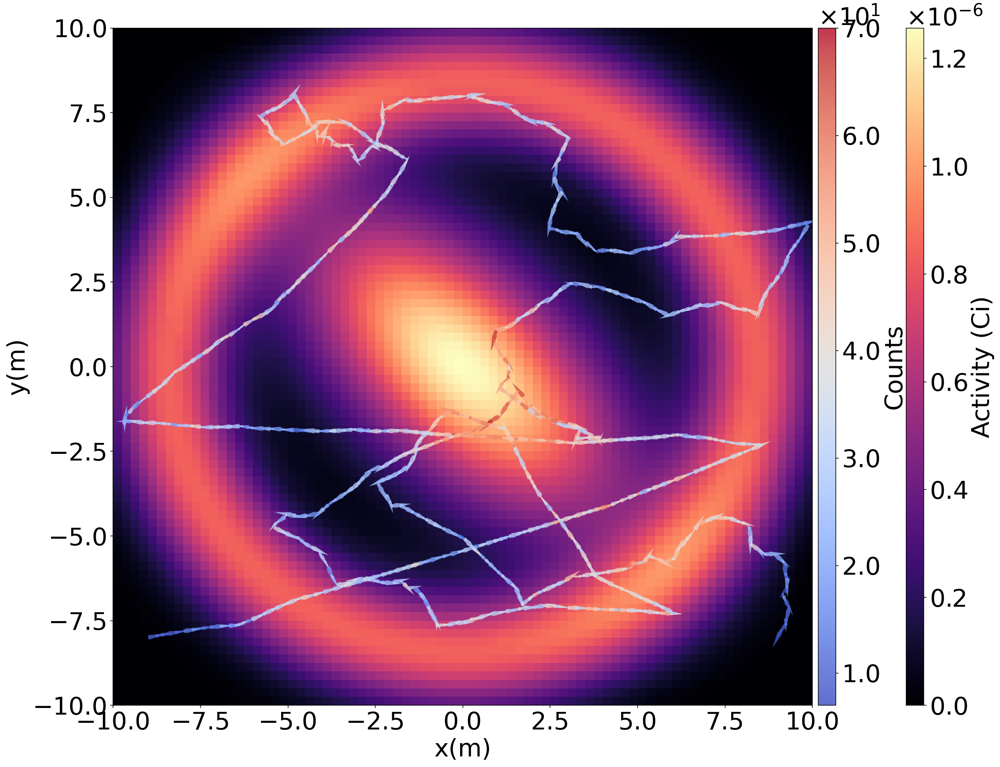

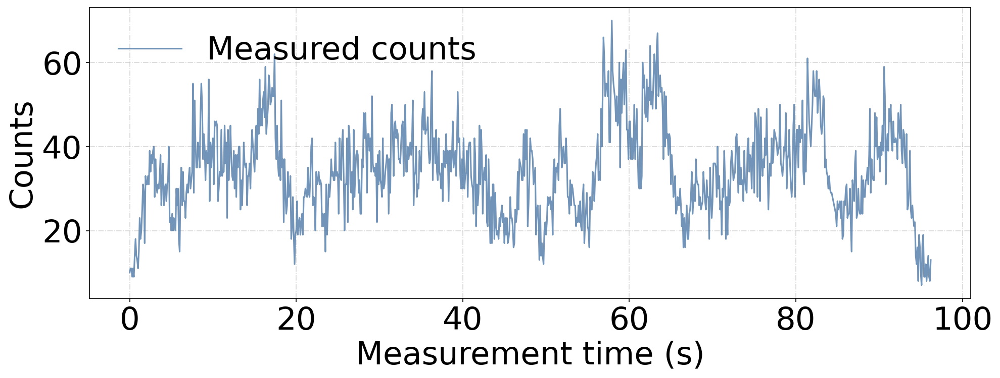

In [6]:

#100 microcurie isotropic Gaussian source
gaussian_src = imager.GaussianSource(src_str = 1e-3,
                                          src_loc=np.array([0,0,0]),
                                         src_cov=np.array([[10,-6,0],
                                                         [-6,10,0],
                                                         [0,0,1]]))

uniform_gaussian_src = imager.UniformGaussianSource(src_str = 100e-6,
                                              src_loc=np.array([0, 0, 0]),
                                         src_cov=np.array([[10,-6,0],
                                                         [-6,10,0],
                                                         [0,0,1]]))

ring_gaussian_src = imager.RingGaussianSource(src_str=2e-3,
                                              src_ctr=np.array([0,0,0]),
                                              r_in=5,
                                              r_out=12
                                             )

ring_uniform_src = imager.UniformRingSource(src_str=100e-6,
                                              src_ctr=np.array([0,0,0]),
                                              r_in=5,
                                              r_out=8
                                             )

#detector radias 10cm and absolute efficiency 1
det = imager.SphericalDetector(det_rad=0.05, abs_eff=0.1)

path = imager.WalkingPath()
#path.load_path("../dataset/50m/0/", "path.csv")
path.make_random_path_2D(start_point = np.array([-9,-8]),
                             finish_point = np.array([9,-8]),
                             path_len = 150,
                             d_thres = 0.28,
                             extent = np.array([[-10,10],
                                               [-10,10],
                                               [-1,1]]),
                         z_coordinate=0.5,
                        seed=116)

extent = np.array([[-10, 10],
                   [-10, 10],
                   [-0.125, 0.125]])

# path = imager.RasterPath()
# path.make_raster_path_2D(
#     extent = extent*0.9,
#     step_size=0.3,
#     v_steplength=2,
#     z_coordinate=1
# )


#test_scenario = imager.Scenario(path=path,
test_scenario = imager.Scenario(path=path,
                                extent = extent,
                                vox_size=0.25,
                                srcs = [ring_gaussian_src, gaussian_src],
                                dets = [det],
                                int_time = 0.1,
                                bkg=0,
                               seed=430)

test_scenario.draw_img(
    saveimg=True,
    fname=fig_dir + "/ground_truth_img",
    dpi=dpi,
    grid=False
)
test_scenario.draw_forward_proj(
    saveimg=True,
    fname=fig_dir + "/ground_truth_fp",
    dpi=dpi
)

test_imager = imager.Imager(test_scenario)

MELM Iterations : (19/20)

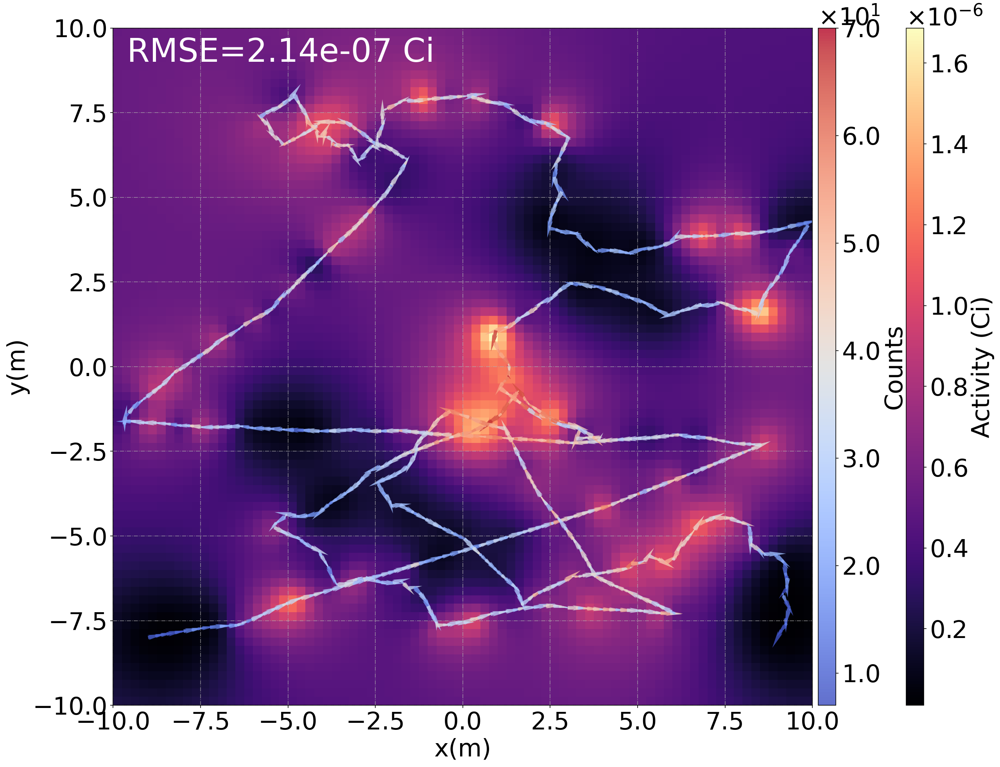

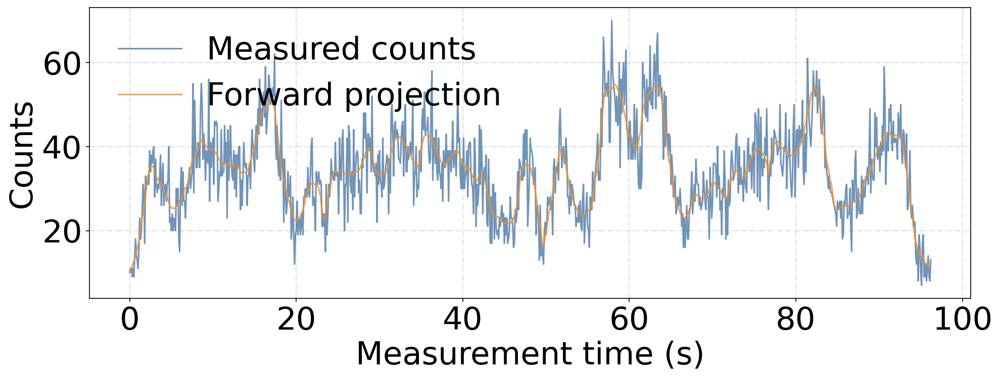

In [7]:
_ = test_imager.MLEM_recon(itr=20)
test_imager.draw_reconed_img(
    text=f"RMSE={np.sqrt((((test_imager.recon_img.src_dist.ravel() - test_scenario.src_dist.ravel()))**2).mean()):.2e} Ci",
)
test_imager.draw_reconed_fp(
)

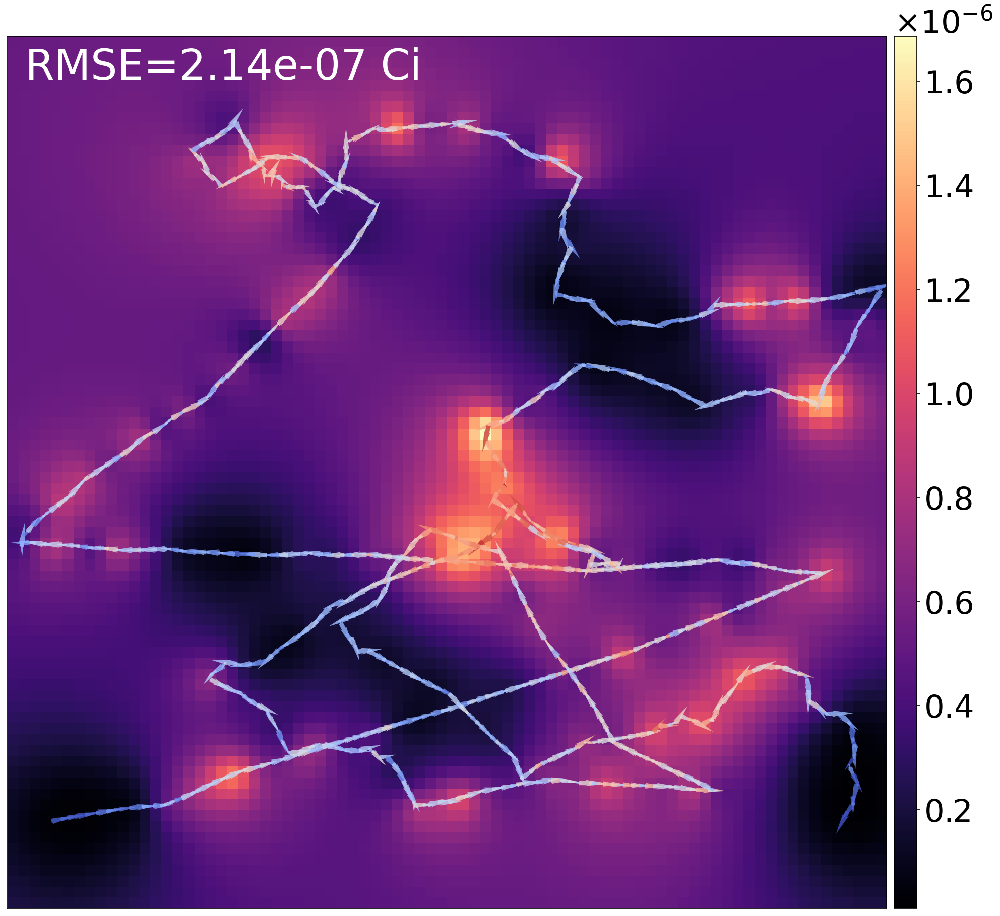

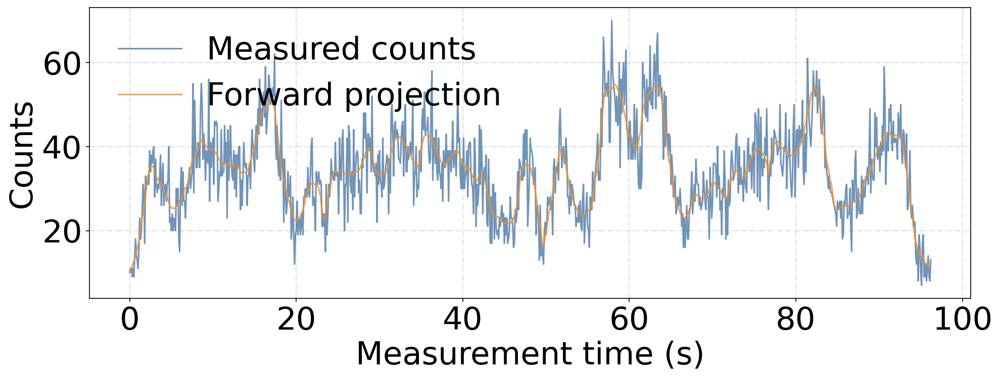

In [8]:
draw_2D_img(
    scenario=test_scenario,
    srcs=[test_imager.recon_img],
    show_img_label_tick=False,
    show_counts_cbar=False,
    cbar_label=None,
    text=f"RMSE={np.sqrt((((test_imager.recon_img.src_dist.ravel() - test_scenario.src_dist.ravel()))**2).mean()):.2e} Ci",
    saveimg=True,
    fname=fig_dir + "/mlem_20itrs_img.png")

test_imager.draw_reconed_fp(
    saveimg=True,
    fname=fig_dir + "/mlem_20itrs_fp.png"
)

MELM Iterations : (199/200)

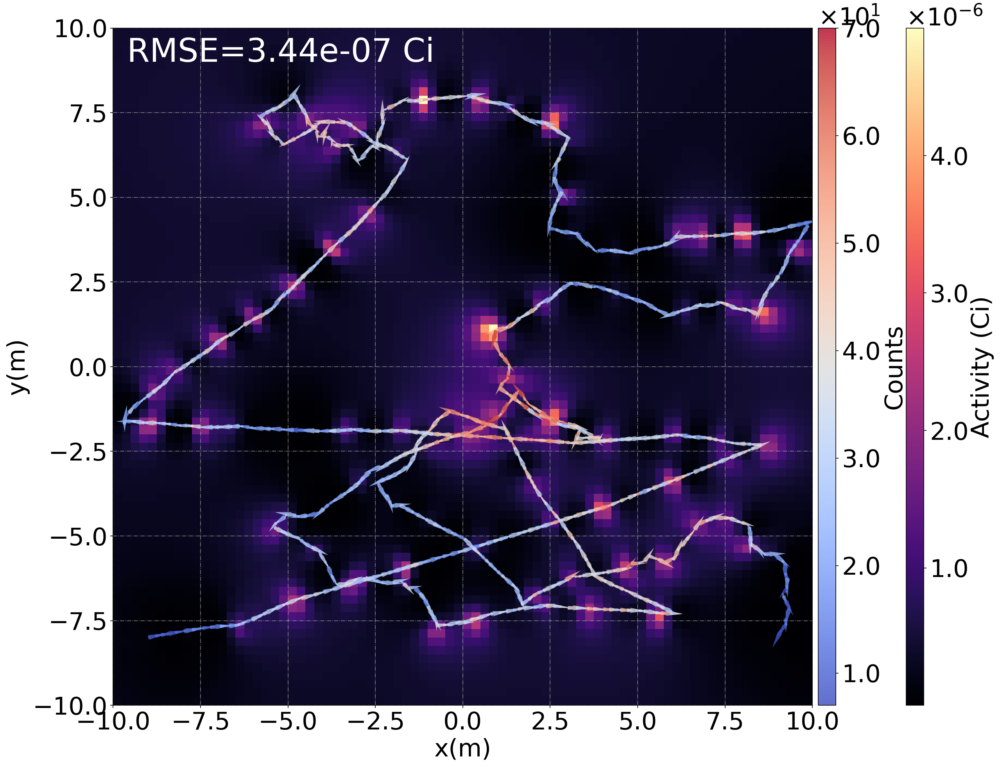

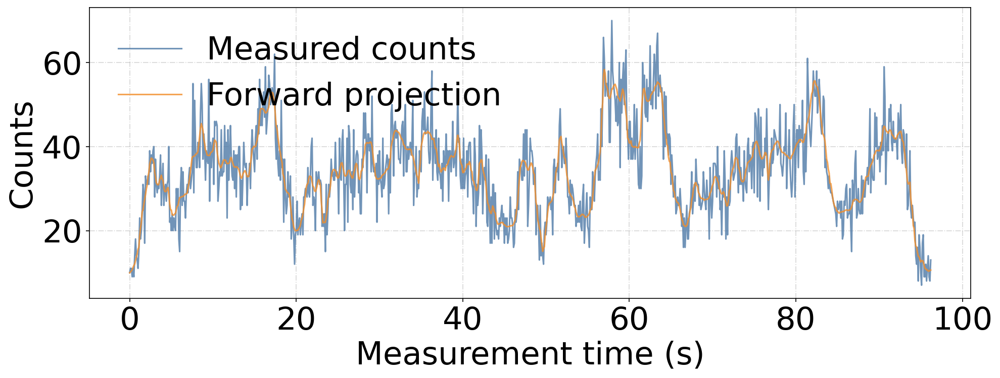

In [9]:
_ = test_imager.MLEM_recon(itr=200)
test_imager.draw_reconed_img(
    text=f"RMSE={np.sqrt((((test_imager.recon_img.src_dist.ravel() - test_scenario.src_dist.ravel()))**2).mean()):.2e} Ci",
)
test_imager.draw_reconed_fp(
)

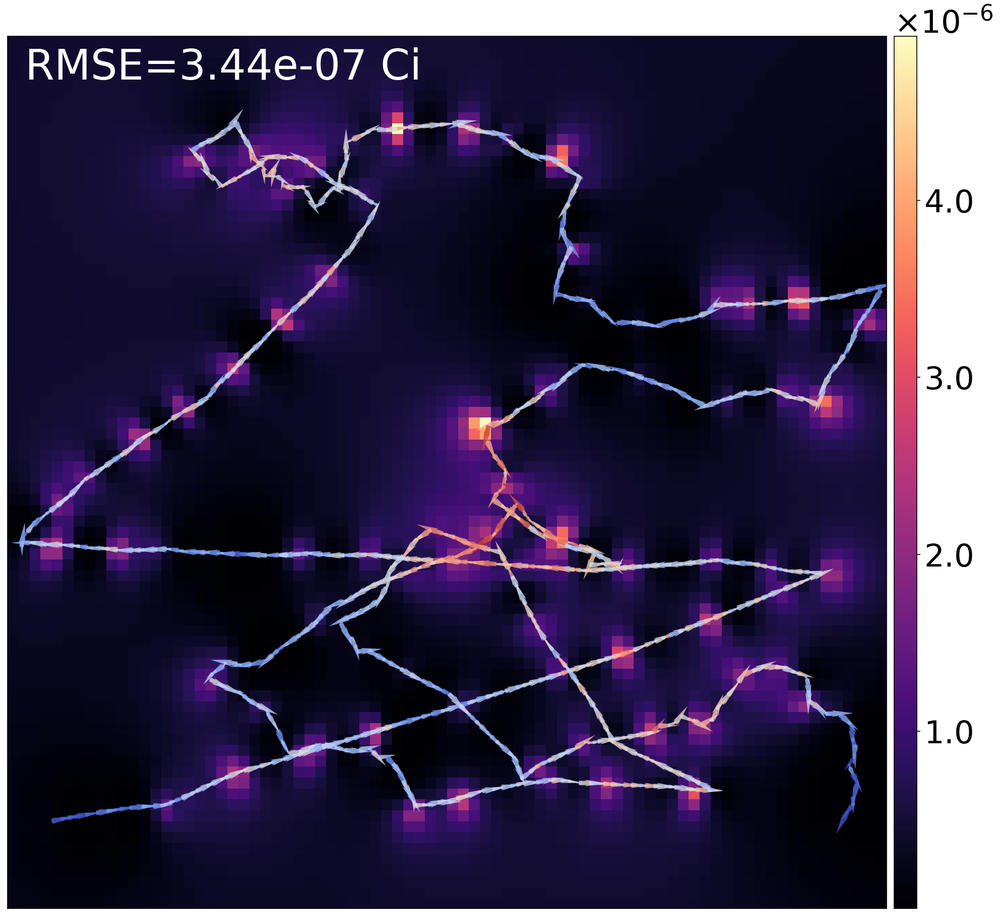

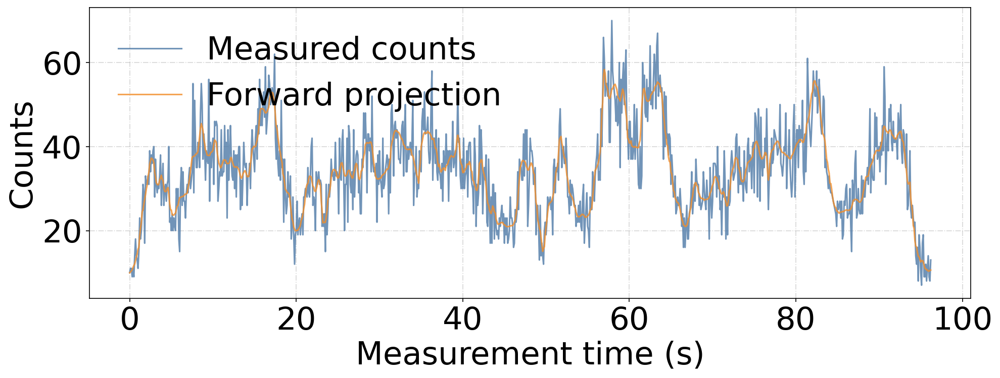

In [10]:
draw_2D_img(
    scenario=test_scenario,
    srcs=[test_imager.recon_img],
    show_img_label_tick=False,
    show_counts_cbar=False,
    cbar_label=None,
    text=f"RMSE={np.sqrt((((test_imager.recon_img.src_dist.ravel() - test_scenario.src_dist.ravel()))**2).mean()):.2e} Ci",
    saveimg=True,
    fname=fig_dir + "/mlem_200itrs_img.png")

test_imager.draw_reconed_fp(
    saveimg=True,
    fname=fig_dir + "/mlem_200itrs_fp.png"
)

KroneckerProduct(80 ⊗ 80 ⊗ 1)
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6400     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.18330D+04    |proj g|=  1.94947D+02

At iterate    5    f= -8.13334D+04    |proj g|=  2.88256D+01


 This problem is unconstrained.



At iterate   10    f= -8.21626D+04    |proj g|=  1.13839D+01

At iterate   15    f= -8.32281D+04    |proj g|=  3.16506D+01

At iterate   20    f= -8.45305D+04    |proj g|=  8.41873D+00

At iterate   25    f= -8.48028D+04    |proj g|=  1.43968D+01

At iterate   30    f= -8.49411D+04    |proj g|=  4.50478D+00

At iterate   35    f= -8.50117D+04    |proj g|=  6.54029D+00

At iterate   40    f= -8.50719D+04    |proj g|=  3.08045D+00

At iterate   45    f= -8.51104D+04    |proj g|=  2.51454D+00

At iterate   50    f= -8.51271D+04    |proj g|=  1.61411D+00

At iterate   55    f= -8.51411D+04    |proj g|=  2.19727D+00

At iterate   60    f= -8.51478D+04    |proj g|=  1.60561D+00

At iterate   65    f= -8.51528D+04    |proj g|=  1.62418D+00

At iterate   70    f= -8.51564D+04    |proj g|=  8.84232D-01

At iterate   75    f= -8.51581D+04    |proj g|=  5.58166D-01

At iterate   80    f= -8.51587D+04    |proj g|=  3.86570D-01

At iterate   85    f= -8.51596D+04    |proj g|=  5.80837D-01

At iter

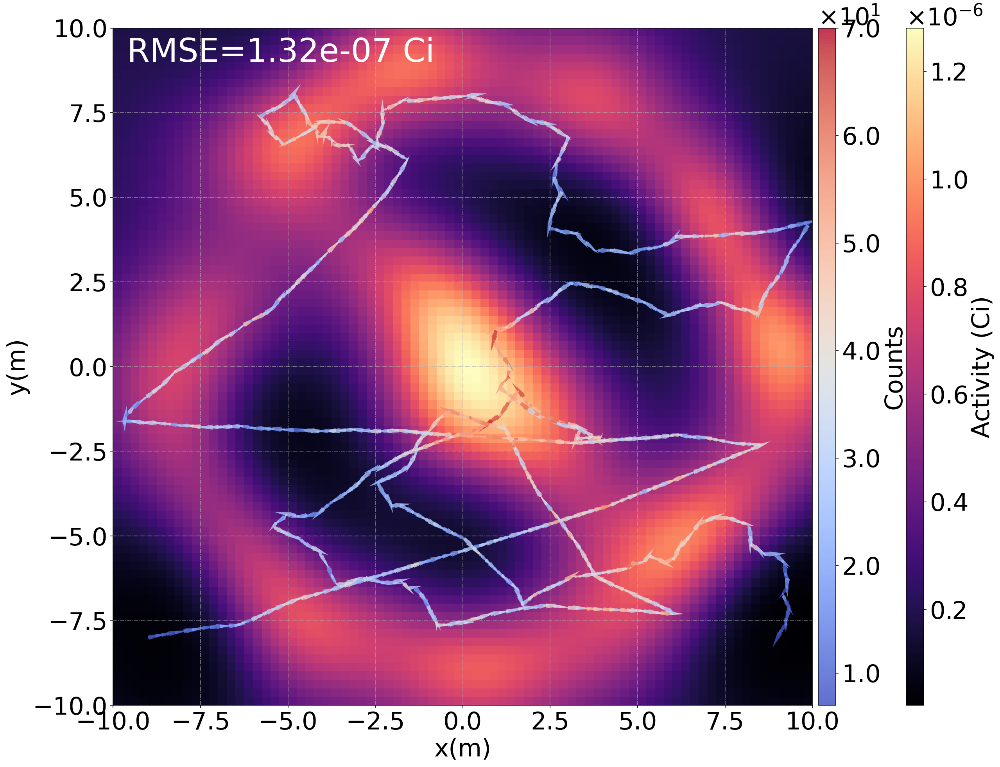

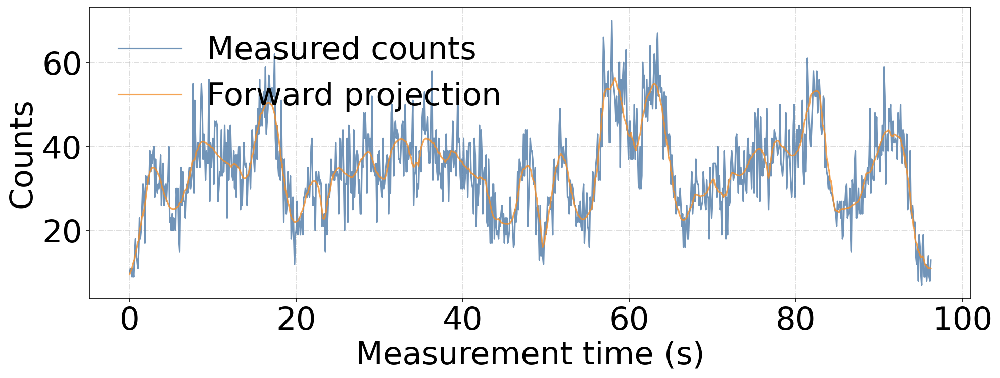

In [11]:
# We start from a guessed hyperparameters
sigma=2
lam=1e-4
_ = test_imager.gpp_recon(sigma=sigma, lam=lam, draw_img=False, kronecker=True)
test_imager.draw_reconed_img(
    text=f"RMSE={np.sqrt((((test_imager.recon_img.src_dist.ravel() - test_scenario.src_dist.ravel()))**2).mean()):.2e} Ci",
)
test_imager.draw_reconed_fp(
)

In [12]:
# Here we perform the automatic hyperparameter selection
result = test_imager.type2_optimization(param_init=np.array([5, 1e-3]), cov_kernel="squared_exponential", method = "L-BFGS-B", start_from_prev=True, kronecker=True, draw_img=False)
print(np.exp(result.x))

draw_img in type2_optimization False
KroneckerProduct(80 ⊗ 80 ⊗ 1)
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6400     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.72712D+04    |proj g|=  1.66546D+03

At iterate    5    f= -8.39765D+04    |proj g|=  5.35293D+01

At iterate   10    f= -8.44534D+04    |proj g|=  9.13753D+00

At iterate   15    f= -8.46047D+04    |proj g|=  6.58101D+00


 This problem is unconstrained.



At iterate   20    f= -8.46584D+04    |proj g|=  7.70813D+00

At iterate   25    f= -8.46807D+04    |proj g|=  3.52975D+00

At iterate   30    f= -8.46919D+04    |proj g|=  2.07351D+00

At iterate   35    f= -8.46939D+04    |proj g|=  2.74787D+00

At iterate   40    f= -8.46952D+04    |proj g|=  1.21990D+00

At iterate   45    f= -8.46956D+04    |proj g|=  2.37722D-01

At iterate   50    f= -8.46959D+04    |proj g|=  6.16414D-01

At iterate   55    f= -8.46960D+04    |proj g|=  5.88959D-01

At iterate   60    f= -8.46960D+04    |proj g|=  1.42182D-01

At iterate   65    f= -8.46960D+04    |proj g|=  8.34058D-02

At iterate   70    f= -8.46960D+04    |proj g|=  8.71006D-02

At iterate   75    f= -8.46960D+04    |proj g|=  4.17684D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized 

 This problem is unconstrained.



At iterate   20    f= -8.46865D+04    |proj g|=  4.08824D-01

At iterate   25    f= -8.46865D+04    |proj g|=  1.48395D-01

At iterate   30    f= -8.46865D+04    |proj g|=  2.17919D-01

At iterate   35    f= -8.46865D+04    |proj g|=  3.28378D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0018470287322998047
Hessian inversion time 9.5367431640625e-07
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     36     42      1     0     0   5.267D-02  -8.469D+04
  F =  -84686.480200786275     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
sigma 5.081

 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     39     44      1     0     0   2.950D-02  -8.471D+04
  F =  -84708.454801541375     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.004248142242431641
Hessian inversion time 9.5367431640625e-07
sigma 4.999999999999999, lambda 0.0009332543007969915
neg_logpose -84708.45480154137
0.5 * logdet 26.312727074639927, sign1.0
nlml -84682.14207446674
lml compute time 0.37654614448547363
[5.00000000e+00 9.33254301e-04]
KroneckerProduct(80 ⊗ 80 ⊗ 1)
RUNNING THE

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -8.49302D+04    |proj g|=  5.48417D-01

At iterate   30    f= -8.49322D+04    |proj g|=  3.99070D-01

At iterate   35    f= -8.49326D+04    |proj g|=  1.11788D-01

At iterate   40    f= -8.49327D+04    |proj g|=  3.67751D-02

At iterate   45    f= -8.49327D+04    |proj g|=  2.05319D-02

At iterate   50    f= -8.49327D+04    |proj g|=  1.25144D-02

At iterate   55    f= -8.49327D+04    |proj g|=  8.13599D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     59     63      1     0     0   3.867D-03  -8.493D+04
  F =  -84932.738229324706     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.


sigma 1.932196807132641, lambda 0.000748944187427616
neg_logpose -84934.3959866969
0.5 * logdet 48.203018380858246, sign1.0
nlml -84886.19296831604
lml compute time 0.30042219161987305
[1.93219681e+00 7.48944187e-04]
KroneckerProduct(80 ⊗ 80 ⊗ 1)
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6400     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.48834D+04    |proj g|=  8.16371D+00

At iterate    5    f= -8.49509D+04    |proj g|=  2.72815D-01

At iterate   10    f= -8.49511D+04    |proj g|=  4.18095D-02

At iterate   15    f= -8.49511D+04    |proj g|=  3.79421D-02

At iterate   20    f= -8.49511D+04    |proj g|=  1.83956D-02

At iterate   25    f= -8.49511D+04    |proj g|=  5.11717D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = num

 This problem is unconstrained.


sigma 1.9196372488426316, lambda 0.0006969376860570786
neg_logpose -84951.1147832752
0.5 * logdet 49.42382395164195, sign1.0
nlml -84901.69095932356
lml compute time 0.44348907470703125
[1.91963725e+00 6.96937686e-04]

KroneckerProduct(80 ⊗ 80 ⊗ 1)
At iterate    1    f= -8.48844D+04    |proj g|=  2.72365D+02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6400     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.21132D+04    |proj g|=  6.27372D+01

At iterate    5    f= -8.48987D+04    |proj g|=  6.83425D+00

At iterate   10    f= -8.49939D+04    |proj g|=  3.57765D+00

At iterate   15    f= -8.50035D+04    |proj g|=  7.44715D-01

At iterate   20    f= -8.50074D+04    |proj g|=  3.28365D-01

At iterate   25    f= -8.50091D+04    |proj g|=  1.57826D-01

At iterate   30    f= -8.50093D+04    |proj g|=  1.09060D-01

At iterate   35    f= -8.50094D+04    |proj g|=  7.46058D-02


 This problem is unconstrained.



At iterate   40    f= -8.50095D+04    |proj g|=  6.79717D-02

At iterate   45    f= -8.50095D+04    |proj g|=  3.20624D-02

At iterate   50    f= -8.50095D+04    |proj g|=  2.82187D-02

At iterate   55    f= -8.50095D+04    |proj g|=  8.37832D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     57     61      1     0     0   6.430D-03  -8.501D+04
  F =  -85009.494384640406     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0027201175689697266
Hessian inversion time 0.0
sigma 2.368188386064489, la

 This problem is unconstrained.


sigma 2.3886933989976025, lambda 0.0006103017358224509
neg_logpose -85010.08073052068
0.5 * logdet 46.6782481695357, sign1.0
nlml -84963.40248235114
lml compute time 0.2655818462371826
[2.38869340e+00 6.10301736e-04]
KroneckerProduct(80 ⊗ 80 ⊗ 1)
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6400     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.49508D+04    |proj g|=  1.24202D+01

At iterate    5    f= -8.50215D+04    |proj g|=  3.01436D-01

At iterate   10    f= -8.50217D+04    |proj g|=  1.46754D-01

At iterate   15    f= -8.50217D+04    |proj g|=  2.94095D-02

At iterate   20    f= -8.50217D+04    |proj g|=  2.81546D-02


 This problem is unconstrained.



At iterate   25    f= -8.50217D+04    |proj g|=  1.81758D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     27     30      1     0     0   1.107D-02  -8.502D+04
  F =  -85021.721343906247     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0014259815216064453
Hessian inversion time 0.0
sigma 2.368188386064489, lambda 0.0005667611218005702
neg_logpose -85021.72134390625
0.5 * logdet 47.876269474249284, sign1.0
nlml -84973.845074432
lml compute time 0.35666799545288086
[2.36818839e+00 5.66761122e-

 This problem is unconstrained.



At iterate   40    f= -8.50624D+04    |proj g|=  6.23536D-02

At iterate   45    f= -8.50624D+04    |proj g|=  2.83454D-02

At iterate   50    f= -8.50624D+04    |proj g|=  2.80747D-02

At iterate   55    f= -8.50624D+04    |proj g|=  2.96078D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     55     60      1     0     0   2.961D-02  -8.506D+04
  F =  -85062.430660653568     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0015540122985839844
Hessian inversion time 9.5367431640625e-07
sigma 2.613

 This problem is unconstrained.



At iterate   25    f= -8.50622D+04    |proj g|=  3.24766D-02

At iterate   30    f= -8.50622D+04    |proj g|=  2.62028D-02

At iterate   35    f= -8.50622D+04    |proj g|=  1.75994D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     35     41      1     0     0   1.760D-02  -8.506D+04
  F =  -85062.183278275654     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.002657175064086914
Hessian inversion time 0.0
sigma 2.638402144906213, lambda 0.000422951616245229
neg_logpose -85062.18327827565
0.5 * 

 This problem is unconstrained.


sigma 2.6131798358911227, lambda 0.0003913394188905012
neg_logpose -85070.81402797191
0.5 * logdet 50.18912096788156, sign1.0
nlml -85020.62490700402
lml compute time 0.3063681125640869
[2.61317984e+00 3.91339419e-04]

At iterate    3    f= -8.50132D+04    |proj g|=  9.50809D+01
KroneckerProduct(80 ⊗ 80 ⊗ 1)
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6400     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.89854D+04    |proj g|=  1.85515D+02

At iterate    5    f= -8.50931D+04    |proj g|=  4.00115D+00

At iterate   10    f= -8.51160D+04    |proj g|=  5.28501D-01

At iterate   15    f= -8.51171D+04    |proj g|=  6.21875D-01


 This problem is unconstrained.



At iterate   20    f= -8.51173D+04    |proj g|=  1.58164D-01

At iterate   25    f= -8.51174D+04    |proj g|=  2.68064D-01

At iterate   30    f= -8.51174D+04    |proj g|=  1.20178D-01

At iterate   35    f= -8.51175D+04    |proj g|=  7.44243D-02

At iterate   40    f= -8.51175D+04    |proj g|=  1.07584D-01

At iterate   45    f= -8.51175D+04    |proj g|=  4.89683D-02

At iterate   50    f= -8.51175D+04    |proj g|=  2.19696D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     53     58      1     0     0   8.242D-03  -8.512D+04
  F =  -85117.504572899066     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     34     39      1     0     0   1.157D-02  -8.512D+04
  F =  -85117.039159360662     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0019779205322265625
Hessian inversion time 7.152557373046875e-07
sigma 2.5902911753154547, lambda 0.00022131919554610496
neg_logpose -85117.03915936066
0.5 * logdet 57.88992084226116, sign1.0
nlml -85059.1492385184
lml compute time 0.587468147277832
[2.59029118e+00 2.21319196e-04]
KroneckerProduct(80 ⊗ 80 ⊗ 1)
RUNNING TH

 This problem is unconstrained.



At iterate   30    f= -8.51224D+04    |proj g|=  2.70213D-02

At iterate   35    f= -8.51224D+04    |proj g|=  2.46889D-02

At iterate   40    f= -8.51224D+04    |proj g|=  1.91344D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     41     44      1     0     0   1.821D-02  -8.512D+04
  F =  -85122.418278305107     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0024290084838867188
Hessian inversion time 1.1920928955078125e-06
sigma 2.5659962994719527, lambda 0.00020345542466544298
neg_logpose -8

 This problem is unconstrained.



At iterate   30    f= -8.51500D+04    |proj g|=  5.15091D-01

At iterate   35    f= -8.51503D+04    |proj g|=  2.75365D-01

At iterate   40    f= -8.51505D+04    |proj g|=  2.58849D-01

At iterate   45    f= -8.51506D+04    |proj g|=  2.21453D-01

At iterate   50    f= -8.51506D+04    |proj g|=  1.54197D-01

At iterate   55    f= -8.51506D+04    |proj g|=  7.30983D-02

At iterate   60    f= -8.51506D+04    |proj g|=  7.56904D-02

At iterate   65    f= -8.51507D+04    |proj g|=  8.79945D-02

At iterate   70    f= -8.51507D+04    |proj g|=  3.76797D-02

At iterate   75    f= -8.51507D+04    |proj g|=  4.83584D-02

At iterate   80    f= -8.51507D+04    |proj g|=  1.91326D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F   

 This problem is unconstrained.



At iterate   35    f= -8.51503D+04    |proj g|=  2.96159D-02

At iterate   40    f= -8.51503D+04    |proj g|=  2.20927D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     42     45      1     0     0   1.366D-02  -8.515D+04
  F =  -85150.321533928800     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.011217117309570312
Hessian inversion time 0.0
sigma 2.3425237195405937, lambda 0.0001184119074260862
neg_logpose -85150.3215339288
0.5 * logdet 70.1399626273533, sign1.0
nlml -85080.18157130145
lml 

 This problem is unconstrained.



At iterate   25    f= -8.51535D+04    |proj g|=  3.22310D-02

At iterate   30    f= -8.51535D+04    |proj g|=  4.17123D-02

At iterate   35    f= -8.51535D+04    |proj g|=  2.19590D-02

At iterate   40    f= -8.51535D+04    |proj g|=  1.82071D-02

At iterate   45    f= -8.51535D+04    |proj g|=  1.66248D-02

At iterate   50    f= -8.51535D+04    |proj g|=  2.05249D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     50     56      1     0     0   2.052D-02  -8.515D+04
  F =  -85153.525061995038     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi

 This problem is unconstrained.



At iterate   30    f= -8.51619D+04    |proj g|=  2.78224D-01

At iterate   35    f= -8.51620D+04    |proj g|=  1.34867D-01

At iterate   40    f= -8.51620D+04    |proj g|=  9.05687D-02

At iterate   45    f= -8.51620D+04    |proj g|=  5.44374D-02

At iterate   50    f= -8.51620D+04    |proj g|=  8.52409D-02

At iterate   55    f= -8.51620D+04    |proj g|=  1.06994D-01

At iterate   60    f= -8.51620D+04    |proj g|=  4.29979D-02

At iterate   65    f= -8.51620D+04    |proj g|=  3.18787D-02

At iterate   70    f= -8.51620D+04    |proj g|=  2.48464D-02

At iterate   75    f= -8.51620D+04    |proj g|=  1.58773D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   40    f= -8.51617D+04    |proj g|=  1.87233D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     41     46      1     0     0   1.658D-02  -8.516D+04
  F =  -85161.686529853090     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0019960403442382812
Hessian inversion time 0.0
sigma 2.281062590771302, lambda 8.081823362495917e-05
neg_logpose -85161.68652985309
0.5 * logdet 76.60619914464597, sign1.0
nlml -85085.08033070844
lml compute time 0.43391990661621094
[2.28106259e+00 8.08182336e

 This problem is unconstrained.



At iterate   35    f= -8.51639D+04    |proj g|=  2.34326D-02

At iterate   40    f= -8.51639D+04    |proj g|=  4.35722D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     42     46      1     0     0   1.989D-02  -8.516D+04
  F =  -85163.895034412461     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0024352073669433594
Hessian inversion time 0.0
sigma 2.2625140732988656, lambda 7.355029987531905e-05
neg_logpose -85163.89503441246
0.5 * logdet 78.29850892204493, sign1.0
nlml -85085.59652549041
l

 This problem is unconstrained.



At iterate   40    f= -8.51648D+04    |proj g|=  6.48820D-02

At iterate   45    f= -8.51648D+04    |proj g|=  2.98153D-02

At iterate   50    f= -8.51648D+04    |proj g|=  3.40703D-02

At iterate   55    f= -8.51648D+04    |proj g|=  1.53201D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     55     62      1     0     0   1.532D-02  -8.516D+04
  F =  -85164.775061340813     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.002671957015991211
Hessian inversion time 0.0
sigma 2.303392189655806, lam

 This problem is unconstrained.



At iterate   30    f= -8.51644D+04    |proj g|=  4.82368D-02

At iterate   35    f= -8.51644D+04    |proj g|=  9.02041D-02

At iterate   40    f= -8.51644D+04    |proj g|=  2.26590D-02

At iterate   45    f= -8.51644D+04    |proj g|=  2.30460D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     47     53      1     0     0   2.595D-02  -8.516D+04
  F =  -85164.410893425942     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.007149219512939453
Hessian inversion time 9.5367431640625e-07
sigma 2.3226

 This problem is unconstrained.



At iterate   25    f= -8.51662D+04    |proj g|=  5.31842D-02

At iterate   30    f= -8.51662D+04    |proj g|=  3.77249D-02

At iterate   35    f= -8.51662D+04    |proj g|=  3.74683D-02

At iterate   40    f= -8.51662D+04    |proj g|=  3.54542D-02

At iterate   45    f= -8.51662D+04    |proj g|=  2.78893D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     48     53      1     0     0   7.703D-02  -8.517D+04
  F =  -85166.240649460131     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.001787185668

 This problem is unconstrained.



At iterate   30    f= -8.51646D+04    |proj g|=  1.51615D-01

At iterate   35    f= -8.51646D+04    |proj g|=  1.15380D-01

At iterate   40    f= -8.51646D+04    |proj g|=  1.07245D-01

At iterate   45    f= -8.51646D+04    |proj g|=  1.03926D-01

At iterate   50    f= -8.51646D+04    |proj g|=  1.03717D-01

At iterate   55    f= -8.51646D+04    |proj g|=  5.63703D-02

At iterate   60    f= -8.51646D+04    |proj g|=  3.98660D-02

At iterate   65    f= -8.51646D+04    |proj g|=  2.56844D-02

At iterate   70    f= -8.51646D+04    |proj g|=  2.22289D-02
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.002160787582397461
Hessian inversion time 9.5367431640625e-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = no

 This problem is unconstrained.



At iterate   30    f= -8.51642D+04    |proj g|=  5.24280D-02

At iterate   35    f= -8.51642D+04    |proj g|=  5.06743D-02

At iterate   40    f= -8.51642D+04    |proj g|=  3.30122D-02

At iterate   45    f= -8.51642D+04    |proj g|=  2.64761D-02

At iterate   50    f= -8.51642D+04    |proj g|=  2.78617D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     50     55      1     0     0   2.786D-02  -8.516D+04
  F =  -85164.228264120669     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.001749038696

 This problem is unconstrained.



At iterate   40    f= -8.51660D+04    |proj g|=  4.36666D-02

At iterate   45    f= -8.51660D+04    |proj g|=  4.22330D-02

At iterate   50    f= -8.51660D+04    |proj g|=  4.18091D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     53     58      1     0     0   1.675D-02  -8.517D+04
  F =  -85165.956569607399     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0015799999237060547
Hessian inversion time 0.0
sigma 2.373966992757248, lambda 5.6160365319139236e-05
neg_logpose -85165.9565696074
0.5 

 This problem is unconstrained.


sigma 2.378848487974077, lambda 6.092550266844881e-05
neg_logpose -85164.76598903543
0.5 * logdet 78.51114158107538, sign1.0
nlml -85086.25484745434
lml compute time 0.36307311058044434
[2.37884849e+00 6.09255027e-05]
KroneckerProduct(80 ⊗ 80 ⊗ 1)
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6400     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.51635D+04    |proj g|=  1.00857D+00

At iterate    5    f= -8.51642D+04    |proj g|=  8.37911D-01

At iterate   10    f= -8.51643D+04    |proj g|=  2.01724D-01

At iterate   15    f= -8.51643D+04    |proj g|=  7.12004D-02

At iterate   20    f= -8.51643D+04    |proj g|=  6.28983D-02

At iterate   25    f= -8.51643D+04    |proj g|=  4.99337D-02

At iterate   30    f= -8.51643D+04    |proj g|=  4.25270D-02

At iterate   35    f= -8.51643D+04    |proj g|=  2.97450D-02

At iterate   40    f= -8.51643D+04    |proj g|=  4.79471D-02


 This problem is unconstrained.



At iterate   45    f= -8.51643D+04    |proj g|=  4.02734D-02

At iterate   50    f= -8.51644D+04    |proj g|=  2.33453D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     51     57      1     0     0   2.443D-02  -8.516D+04
  F =  -85164.350623358885     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.002821683883666992
Hessian inversion time 1.1920928955078125e-06
sigma 2.399553569728852, lambda 6.092550266844881e-05
neg_logpose -85164.35062335889
0.5 * logdet 78.07690998325023, sign1.0
nlml -85

 This problem is unconstrained.



At iterate   40    f= -8.51661D+04    |proj g|=  3.23857D-02

At iterate   45    f= -8.51661D+04    |proj g|=  2.76232D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     46     50      1     0     0   4.490D-02  -8.517D+04
  F =  -85166.054053142696     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0022978782653808594
Hessian inversion time 0.0
sigma 2.378848487974077, lambda 5.529006649506685e-05
neg_logpose -85166.0540531427
0.5 * logdet 79.77529123208542, sign1.0
nlml -85086.27876191061
lml

 This problem is unconstrained.



At iterate   35    f= -8.51652D+04    |proj g|=  3.52331D-02

At iterate   40    f= -8.51652D+04    |proj g|=  4.44923D-02

At iterate   45    f= -8.51652D+04    |proj g|=  2.35223D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     48     54      1     0     0   3.663D-02  -8.517D+04
  F =  -85165.217005067403     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.003103971481323242
Hessian inversion time 0.0
sigma 2.3984750517250264, lambda 5.7271228556045056e-05
neg_logpose -85165.2170050674
0.5 

 This problem is unconstrained.



At iterate   30    f= -8.51648D+04    |proj g|=  3.15184D-02

At iterate   35    f= -8.51648D+04    |proj g|=  4.51878D-02

At iterate   40    f= -8.51648D+04    |proj g|=  6.25064D-02

At iterate   45    f= -8.51648D+04    |proj g|=  5.68739D-02

At iterate   50    f= -8.51648D+04    |proj g|=  3.20126D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     52     57      1     0     0   3.795D-02  -8.516D+04
  F =  -85164.788857995038     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.021793842315

 This problem is unconstrained.



At iterate   35    f= -8.51664D+04    |proj g|=  3.65132D-02

At iterate   40    f= -8.51664D+04    |proj g|=  4.24663D-02

At iterate   45    f= -8.51664D+04    |proj g|=  3.68700D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     49     53      1     0     0   3.104D-02  -8.517D+04
  F =  -85166.397118919471     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0022351741790771484
Hessian inversion time 9.5367431640625e-07
sigma 2.3984750517250264, lambda 5.1941664711118745e-05
neg_logpose -8516

 This problem is unconstrained.



At iterate   35    f= -8.51649D+04    |proj g|=  3.66186D-02

At iterate   40    f= -8.51649D+04    |proj g|=  6.11285D-02

At iterate   45    f= -8.51649D+04    |proj g|=  2.35272D-02
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0014808177947998047
Hessian inversion time 0.0

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     46     51      1     0     0   1.833D-02  -8.516D+04
  F =  -85164.926210442878     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
sigma 2.3854068121285406, lambda 5.9675800250877236e-05
neg_logpose -85164.92621044288
0.

 This problem is unconstrained.



At iterate   35    f= -8.51645D+04    |proj g|=  3.95111D-02

At iterate   40    f= -8.51645D+04    |proj g|=  7.75403D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     42     49      1     0     0   2.067D-02  -8.516D+04
  F =  -85164.506257888250     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0016989707946777344
Hessian inversion time 0.0
sigma 2.40623522247729, lambda 5.9675800250877236e-05
neg_logpose -85164.50625788825
0.5 * logdet 78.2189553064702, sign1.0
nlml -85086.28730258178
lml

 This problem is unconstrained.



At iterate   25    f= -8.51662D+04    |proj g|=  6.53338D-02

At iterate   30    f= -8.51662D+04    |proj g|=  3.32492D-02

At iterate   35    f= -8.51662D+04    |proj g|=  3.32768D-02

At iterate   40    f= -8.51662D+04    |proj g|=  3.34052D-02

At iterate   45    f= -8.51662D+04    |proj g|=  2.59345D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     46     50      1     0     0   6.346D-02  -8.517D+04
  F =  -85166.177605226709     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.002007961273

 This problem is unconstrained.



At iterate   25    f= -8.51649D+04    |proj g|=  2.73951D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     26     31      1     0     0   7.719D-02  -8.516D+04
  F =  -85164.867629607950     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0060880184173583984
Hessian inversion time 0.0
sigma 2.376831371191244, lambda 6.064729964637753e-05
neg_logpose -85164.86762960795
0.5 * logdet 78.6110091418584, sign1.0
nlml -85086.2566204661
lml compute time 0.4045090675354004
[2.37683137e+00 6.06472996e-05

 This problem is unconstrained.



At iterate   20    f= -8.51645D+04    |proj g|=  3.89012D-02

At iterate   25    f= -8.51645D+04    |proj g|=  4.13009D-02

At iterate   30    f= -8.51645D+04    |proj g|=  1.77931D-02

At iterate   35    f= -8.51645D+04    |proj g|=  2.77928D-02

At iterate   40    f= -8.51645D+04    |proj g|=  3.87683D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     40     45      1     0     0   3.877D-02  -8.516D+04
  F =  -85164.457349798671     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.001335859298

 This problem is unconstrained.



At iterate   25    f= -8.51661D+04    |proj g|=  6.34470D-02

At iterate   30    f= -8.51661D+04    |proj g|=  6.18327D-02

At iterate   35    f= -8.51661D+04    |proj g|=  9.03249D-02

At iterate   40    f= -8.51661D+04    |proj g|=  4.66927D-02

At iterate   45    f= -8.51662D+04    |proj g|=  3.02960D-02

At iterate   50    f= -8.51662D+04    |proj g|=  4.35678D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     51     55      1     0     0   4.040D-02  -8.517D+04
  F =  -85166.151107971251     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi

 This problem is unconstrained.



At iterate   30    f= -8.51649D+04    |proj g|=  7.49326D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     30     33      1     0     0   7.493D-02  -8.516D+04
  F =  -85164.924809939490     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0022172927856445312
Hessian inversion time 0.0
sigma 2.385173216385656, lambda 5.970201070139315e-05
neg_logpose -85164.92480993949
0.5 * logdet 78.64633686467289, sign1.0
nlml -85086.27847307481
lml compute time 0.4189469814300537
[2.38517322e+00 5.97020107e-

 This problem is unconstrained.



At iterate   25    f= -8.51645D+04    |proj g|=  6.05844D-02

At iterate   30    f= -8.51645D+04    |proj g|=  5.06318D-02

At iterate   35    f= -8.51645D+04    |proj g|=  4.67340D-02

At iterate   40    f= -8.51645D+04    |proj g|=  6.65537D-02

At iterate   45    f= -8.51645D+04    |proj g|=  2.77164D-02

At iterate   50    f= -8.51645D+04    |proj g|=  2.71528D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     52     60      1     0     0   3.156D-02  -8.516D+04
  F =  -85164.505390211270     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi

 This problem is unconstrained.



At iterate   30    f= -8.51662D+04    |proj g|=  4.30689D-02

At iterate   35    f= -8.51662D+04    |proj g|=  3.40667D-02

At iterate   40    f= -8.51662D+04    |proj g|=  3.30173D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     44     48      1     0     0   6.730D-02  -8.517D+04
  F =  -85166.176247711221     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0016760826110839844
Hessian inversion time 0.0
sigma 2.385173216385656, lambda 5.416875419487089e-05
neg_logpose -85166.17624771122
0.5 

 This problem is unconstrained.


sigma 2.385406331670584, lambda 5.967585414588877e-05
neg_logpose -85164.92583096496
0.5 * logdet 78.65106839613983, sign1.0
nlml -85086.27476256882
lml compute time 0.35614895820617676
[2.38540633e+00 5.96758541e-05]
KroneckerProduct(80 ⊗ 80 ⊗ 1)
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6400     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.51637D+04    |proj g|=  1.00685D+00

At iterate    5    f= -8.51643D+04    |proj g|=  1.04847D+00


 This problem is unconstrained.



At iterate   10    f= -8.51645D+04    |proj g|=  2.06877D-01

At iterate   15    f= -8.51645D+04    |proj g|=  5.92689D-02

At iterate   20    f= -8.51645D+04    |proj g|=  4.61267D-02

At iterate   25    f= -8.51645D+04    |proj g|=  4.40840D-02

At iterate   30    f= -8.51645D+04    |proj g|=  6.89800D-02

At iterate   35    f= -8.51645D+04    |proj g|=  3.22544D-02

At iterate   40    f= -8.51645D+04    |proj g|=  4.57114D-02

At iterate   45    f= -8.51645D+04    |proj g|=  3.03595D-02

At iterate   50    f= -8.51645D+04    |proj g|=  3.00965D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     51     55   

 This problem is unconstrained.



At iterate   10    f= -8.51661D+04    |proj g|=  2.70450D-01

At iterate   15    f= -8.51661D+04    |proj g|=  1.09676D-01

At iterate   20    f= -8.51662D+04    |proj g|=  8.97377D-02

At iterate   25    f= -8.51662D+04    |proj g|=  6.80474D-02

At iterate   30    f= -8.51662D+04    |proj g|=  3.64507D-02

At iterate   35    f= -8.51662D+04    |proj g|=  4.43834D-02

At iterate   40    f= -8.51662D+04    |proj g|=  2.86571D-02

At iterate   45    f= -8.51662D+04    |proj g|=  3.45614D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     46     50      1     0     0   3.314D-02  -8.517D+04
  F =  -85166.1777186

 This problem is unconstrained.


sigma 2.3854068121269902, lambda 5.967580025105108e-05
neg_logpose -85164.92581597478
0.5 * logdet 78.65130140723376, sign1.0
nlml -85086.27451456754
lml compute time 0.3595898151397705
[2.38540681e+00 5.96758003e-05]
KroneckerProduct(80 ⊗ 80 ⊗ 1)
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6400     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.51637D+04    |proj g|=  1.00673D+00

At iterate    5    f= -8.51643D+04    |proj g|=  1.04792D+00

At iterate   10    f= -8.51645D+04    |proj g|=  2.07929D-01

At iterate   15    f= -8.51645D+04    |proj g|=  6.28626D-02

At iterate   20    f= -8.51645D+04    |proj g|=  4.31125D-02

At iterate   25    f= -8.51645D+04    |proj g|=  4.35145D-02

At iterate   30    f= -8.51645D+04    |proj g|=  4.63536D-02


 This problem is unconstrained.



At iterate   35    f= -8.51645D+04    |proj g|=  4.97578D-02

At iterate   40    f= -8.51645D+04    |proj g|=  3.12201D-02

At iterate   45    f= -8.51645D+04    |proj g|=  2.99922D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     48     54      1     0     0   4.702D-02  -8.516D+04
  F =  -85164.506727912900     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.005002021789550781
Hessian inversion time 9.5367431640625e-07
sigma 2.406235222475711, lambda 5.967580025105108e-05
neg_logpose -85164.5

 This problem is unconstrained.



At iterate   35    f= -8.51662D+04    |proj g|=  5.87150D-02

At iterate   40    f= -8.51662D+04    |proj g|=  2.69622D-02

At iterate   45    f= -8.51662D+04    |proj g|=  2.54507D-02

At iterate   50    f= -8.51662D+04    |proj g|=  3.78334D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     51     56      1     0     0   3.056D-02  -8.517D+04
  F =  -85166.177909214544     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0023376941680908203
Hessian inversion time 0.0
sigma 2.3854068121269902, l

 This problem is unconstrained.



At iterate   20    f= -8.51649D+04    |proj g|=  5.08759D-02

At iterate   25    f= -8.51649D+04    |proj g|=  3.54593D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     27     31      1     0     0   1.482D-02  -8.516D+04
  F =  -85164.925813110036     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0015749931335449219
Hessian inversion time 0.0
sigma 2.3854068121285406, lambda 5.9675800250877236e-05
neg_logpose -85164.92581311004
0.5 * logdet 78.65166712693221, sign1.0
nlml -85086.2741459831
l

 This problem is unconstrained.



At iterate   30    f= -8.51645D+04    |proj g|=  5.08950D-02

At iterate   35    f= -8.51645D+04    |proj g|=  1.96118D-02

At iterate   40    f= -8.51645D+04    |proj g|=  2.58271D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     44     49      1     0     0   1.846D-02  -8.516D+04
  F =  -85164.506259151938     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.0018260478973388672
Hessian inversion time 0.0
sigma 2.40623522247729, lambda 5.9675800250877236e-05
neg_logpose -85164.50625915194
0.5 

 This problem is unconstrained.



At iterate   40    f= -8.51662D+04    |proj g|=  2.55082D-02

At iterate   45    f= -8.51662D+04    |proj g|=  2.75287D-02

At iterate   50    f= -8.51662D+04    |proj g|=  3.83594D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 6400     52     57      1     0     0   2.184D-02  -8.517D+04
  F =  -85166.178203701085     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
np.diag(d2fdxi2 * dLdf) term removed
np.diag(d2fdxi2 * dLdf) term removed
Hessian computation time 0.006546735763549805
Hessian inversion time 9.5367431640625e-07
sigma 2.3854068121285406, lambda 5.41447352018622e-05
neg_logpose -85166.1

KroneckerProduct(80 ⊗ 80 ⊗ 1)
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6400     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.03097D+04    |proj g|=  2.29300D+02

At iterate    5    f= -8.08966D+04    |proj g|=  2.91163D+01

At iterate   10    f= -8.18793D+04    |proj g|=  1.98996D+01

At iterate   15    f= -8.22903D+04    |proj g|=  1.31008D+01

At iterate   20    f= -8.29095D+04    |proj g|=  1.34282D+01

At iterate   25    f= -8.41629D+04    |proj g|=  2.80929D+01

At iterate   30    f= -8.45473D+04    |proj g|=  2.33875D+01

At iterate   35    f= -8.47129D+04    |proj g|=  1.03394D+01


 This problem is unconstrained.



At iterate   40    f= -8.48133D+04    |proj g|=  6.30437D+00

At iterate   45    f= -8.49193D+04    |proj g|=  1.25411D+01

At iterate   50    f= -8.49785D+04    |proj g|=  5.67329D+00

At iterate   55    f= -8.50398D+04    |proj g|=  8.41396D+00

At iterate   60    f= -8.50780D+04    |proj g|=  4.22880D+00

At iterate   65    f= -8.51082D+04    |proj g|=  3.67573D+00

At iterate   70    f= -8.51228D+04    |proj g|=  3.22945D+00

At iterate   75    f= -8.51385D+04    |proj g|=  5.20828D+00

At iterate   80    f= -8.51459D+04    |proj g|=  1.86573D+00

At iterate   85    f= -8.51509D+04    |proj g|=  1.78506D+00

At iterate   90    f= -8.51555D+04    |proj g|=  1.20538D+00

At iterate   95    f= -8.51596D+04    |proj g|=  1.46614D+00

At iterate  100    f= -8.51620D+04    |proj g|=  1.50904D+00

At iterate  105    f= -8.51631D+04    |proj g|=  9.96887D-01

At iterate  110    f= -8.51635D+04    |proj g|=  3.71403D-01

At iterate  115    f= -8.51640D+04    |proj g|=  4.93565D-01

At iter

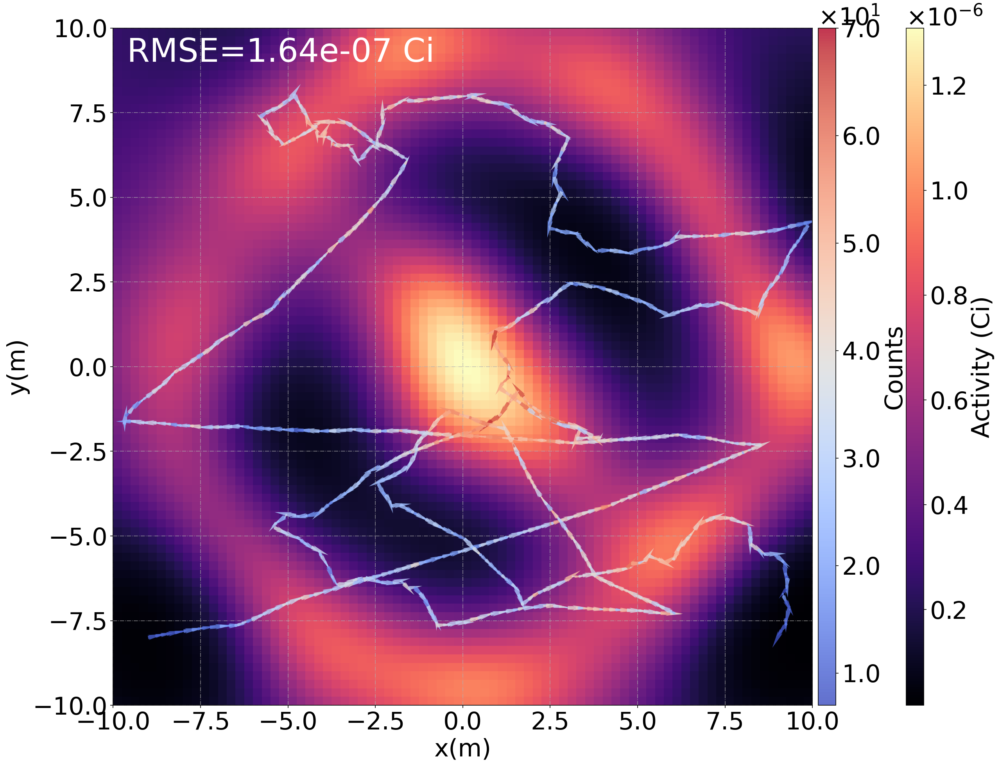

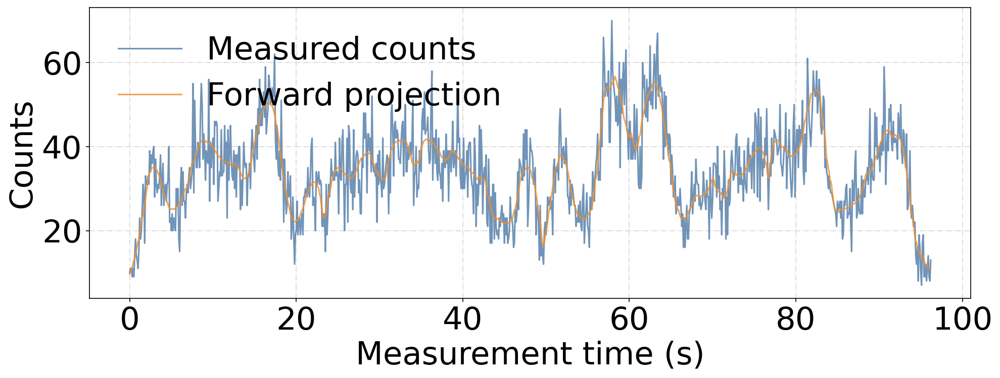

In [13]:
sigma, lam = np.exp(result.x)
# GPP reconstruction with the optimized hyperparameters
_ = test_imager.gpp_recon(sigma=sigma, lam=lam, draw_img=False, kronecker=True)

test_imager.draw_reconed_img(
    text=f"RMSE={np.sqrt((((test_imager.recon_img.src_dist.ravel() - test_scenario.src_dist.ravel()))**2).mean()):.2e} Ci",
#    saveimg=True,
#    fname="/Users/jaewon/Research/mypapers/gpp/fig/ring_gaussian_src_figs/gsrc_gpp_optimal_sigma_lam_img.png"
)

test_imager.draw_reconed_fp(
#    saveimg=True,
#    fname="/Users/jaewon/Research/mypapers/gpp/fig/ring_gaussian_src_figs/gsrc_gpp_optimal_sigma_lam_fp.png"
)

In [14]:
# optimized hyperparameters
print(sigma, lam)

2.3854068121285406 5.9675800250877236e-05


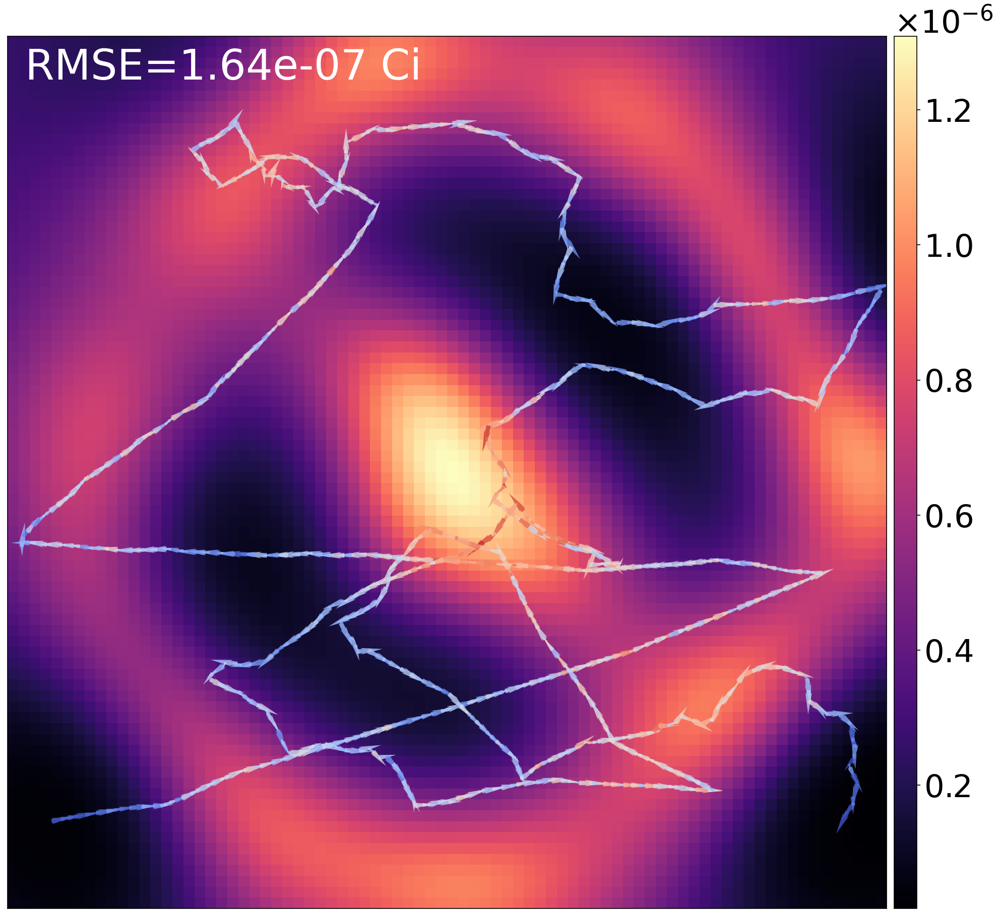

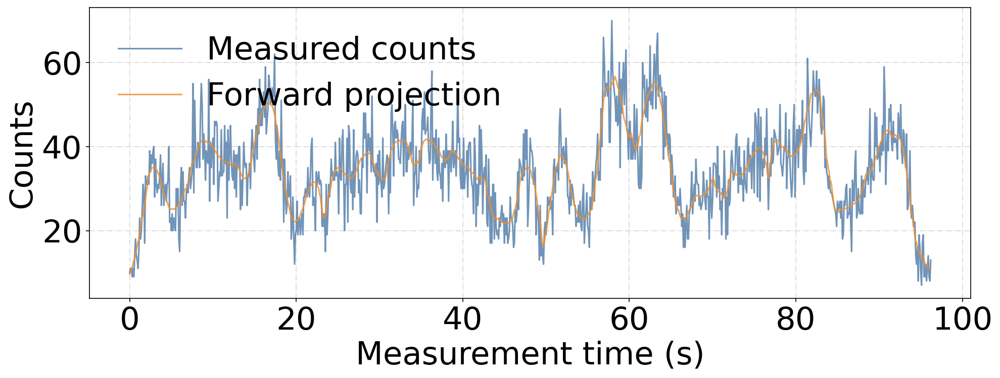

In [15]:
draw_2D_img(
    scenario=test_scenario,
    srcs=[test_imager.recon_img],
    show_img_label_tick=False,
    show_counts_cbar=False,
    cbar_label=None,
    text=f"RMSE={np.sqrt((((test_imager.recon_img.src_dist.ravel() - test_scenario.src_dist.ravel()))**2).mean()):.2e} Ci",
    saveimg=True,
    fname=fig_dir + "/gsrc_gpp_optimal_sigma_lam_img.png")

test_imager.draw_reconed_fp(
    saveimg=True,
    fname=fig_dir + "/gsrc_gpp_optimal_sigma_lam_fp.png"
)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6400     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.18905D+04    |proj g|=  2.87552D+02


 This problem is unconstrained.



At iterate    5    f= -8.13620D+04    |proj g|=  4.53327D+01

At iterate   10    f= -8.20012D+04    |proj g|=  1.58416D+01

At iterate   15    f= -8.24624D+04    |proj g|=  1.45329D+01

At iterate   20    f= -8.35235D+04    |proj g|=  4.88367D+01

At iterate   25    f= -8.42480D+04    |proj g|=  1.26526D+01

At iterate   30    f= -8.45252D+04    |proj g|=  8.01908D+00

At iterate   35    f= -8.47512D+04    |proj g|=  1.01682D+01

At iterate   40    f= -8.48441D+04    |proj g|=  8.33048D+00

At iterate   45    f= -8.49393D+04    |proj g|=  1.04219D+01

At iterate   50    f= -8.50016D+04    |proj g|=  3.85045D+00

At iterate   55    f= -8.50528D+04    |proj g|=  1.15672D+01

At iterate   60    f= -8.50837D+04    |proj g|=  7.02830D+00

At iterate   65    f= -8.51144D+04    |proj g|=  2.79194D+00

At iterate   70    f= -8.51286D+04    |proj g|=  3.95621D+00

At iterate   75    f= -8.51399D+04    |proj g|=  4.75296D+00

At iterate   80    f= -8.51494D+04    |proj g|=  1.40075D+00

At iter

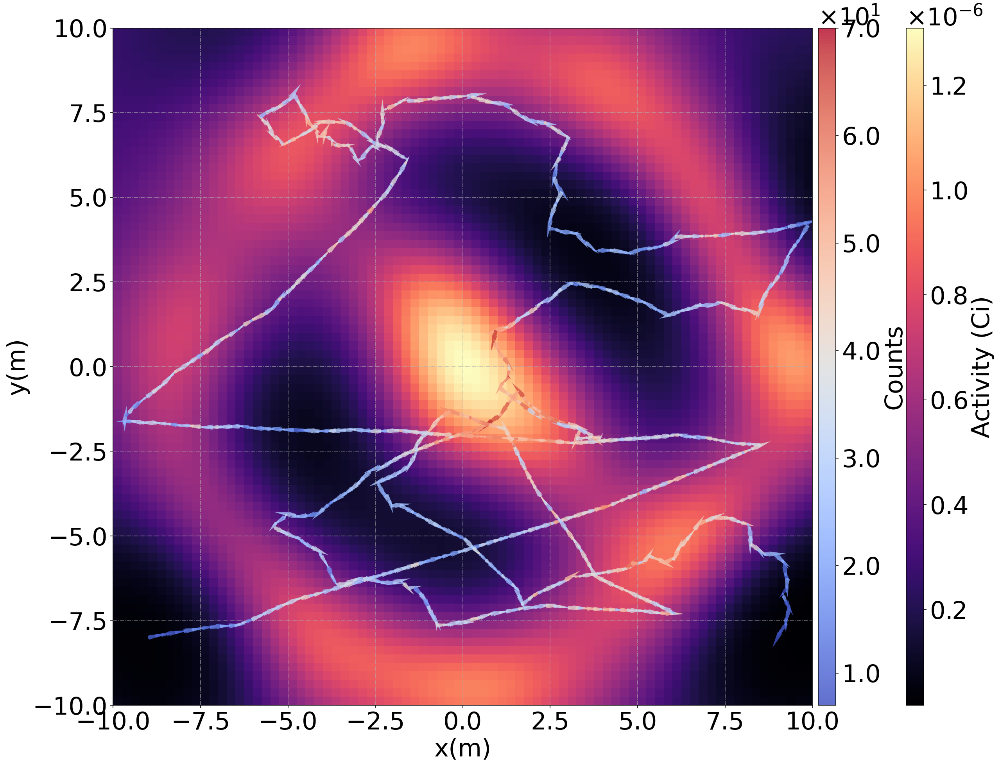

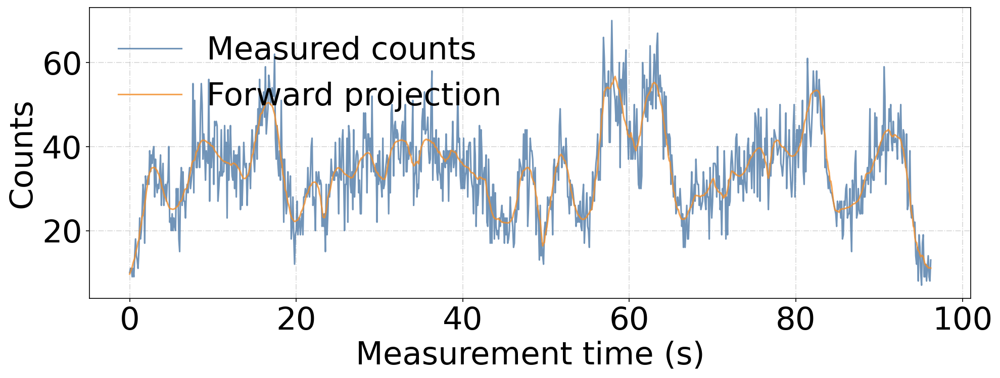

1it [00:00, 93.45it/s]
1it [00:00, 89.37it/s]
1it [00:00, 133.17it/s]
1it [00:00, 166.47it/s]
1it [00:00, 147.14it/s]


In [16]:
mean, cov, hessian = test_imager.laplace_approx(sigma=sigma, lam=lam)
test_imager.draw_reconed_img()
test_imager.draw_reconed_fp()

int_time=0.1
normal_approx = norm(loc = mean.ravel(), scale=np.sqrt(np.diag(cov)))

QT_05 = normal_approx.ppf(0.025)
QT_90 = normal_approx.ppf(0.90)
QT_95 = normal_approx.ppf(0.975)

QT_05 = imager.imager.inv_link(lam = lam, xi=QT_05.reshape(-1,1), cov = test_imager.cov)
QT_90 = imager.imager.inv_link(lam = lam, xi=QT_90.reshape(-1,1), cov = test_imager.cov)
QT_95 = imager.imager.inv_link(lam = lam, xi=QT_95.reshape(-1,1), cov = test_imager.cov)

CI_90_img = imager.DistributedSource(src_str = (QT_95-QT_05).sum()/3.7e10,
                         src_dist=np.reshape((QT_95-QT_05), test_scenario.dims)/3.7e10)

QT_90_img = imager.DistributedSource(src_str = QT_90.sum()/3.7e10,
                         src_dist=np.reshape(QT_90, test_scenario.dims)/3.7e10)

QT_95_img = imager.DistributedSource(src_str = QT_95.sum()/3.7e10,
                         src_dist=np.reshape(QT_95, test_scenario.dims)/3.7e10)

QT_05_img = imager.DistributedSource(src_str = QT_05.sum()/3.7e10,
                         src_dist=np.reshape(QT_05, test_scenario.dims)/3.7e10)

CI_90_scenario = imager.Scenario(path=path,
                                extent = test_scenario.extent,
                                vox_size=test_scenario.vox_size,
                                srcs = [CI_90_img],
                                dets = [det],
                                int_time = int_time,
                                bkg=0)
QT_95_scenario = imager.Scenario(path=path,
                                extent = test_scenario.extent,
                                vox_size=test_scenario.vox_size,
                                srcs = [QT_95_img],
                                dets = [det],
                                int_time = int_time,
                                bkg=0)

QT_90_scenario = imager.Scenario(path=path,
                                extent = test_scenario.extent,
                                vox_size=test_scenario.vox_size,
                                srcs = [QT_90_img],
                                dets = [det],
                                int_time = int_time,
                                bkg=0)

QT_05_scenario = imager.Scenario(path=path,
                                extent = test_scenario.extent,
                                vox_size=test_scenario.vox_size,
                                srcs = [QT_05_img],
                                dets = [det],
                                int_time = int_time,
                                bkg=0)

CI_90_scenario.counts = test_scenario.counts


bool_map = np.ones((gaussian_src+ring_gaussian_src).src_dist.shape) * 0.5

bool_map[((gaussian_src+ring_gaussian_src).src_dist > 0) &\
         ((gaussian_src+ring_gaussian_src).src_dist*3.7e10 > QT_05.reshape(test_scenario.dims)) &\
         ((gaussian_src+ring_gaussian_src).src_dist*3.7e10 < QT_95.reshape(test_scenario.dims))] = 0.5

bool_map[((gaussian_src+ring_gaussian_src).src_dist > 0) &\
         ((gaussian_src+ring_gaussian_src).src_dist*3.7e10 > QT_95.reshape(test_scenario.dims))] = 1

bool_map[((gaussian_src+ring_gaussian_src).src_dist > 0) &\
         ((gaussian_src+ring_gaussian_src).src_dist*3.7e10 < QT_05.reshape(test_scenario.dims))] = 0



bool_img = imager.DistributedSource(src_str = bool_map.sum(),
                         src_dist=np.reshape(bool_map, test_scenario.dims))

bool_scenario = imager.Scenario(path=path,
                                extent = test_scenario.extent,
                                vox_size=test_scenario.vox_size,
                                srcs = [bool_img],
                                dets = [det],
                                int_time = 0.1,
                                bkg = 0)
bool_scenario.counts = test_scenario.counts


#step along the hotspot of the reconstructed img
true_dist = (gaussian_src+ring_gaussian_src).src_dist.reshape((gaussian_src+ring_gaussian_src).src_dist.shape[:2])
recon_dist = test_imager.recon_img.src_dist.reshape(test_imager.recon_img.src_dist.shape[:2])

QT95_dist = QT_95_img.src_dist.reshape(QT_95_img.src_dist.shape[:2])
QT05_dist = QT_05_img.src_dist.reshape(QT_05_img.src_dist.shape[:2])
x_ctr = test_scenario.x_ctr
y_ctr = test_scenario.y_ctr

#idx = np.unravel_index(recon_dist.argmax(), QT_05_img.src_dist.shape[:2])
idx_y = -0
idx_x = -0
idx = (np.argmin(np.abs(y_ctr-idx_y)), np.argmin(np.abs(x_ctr-idx_x)))


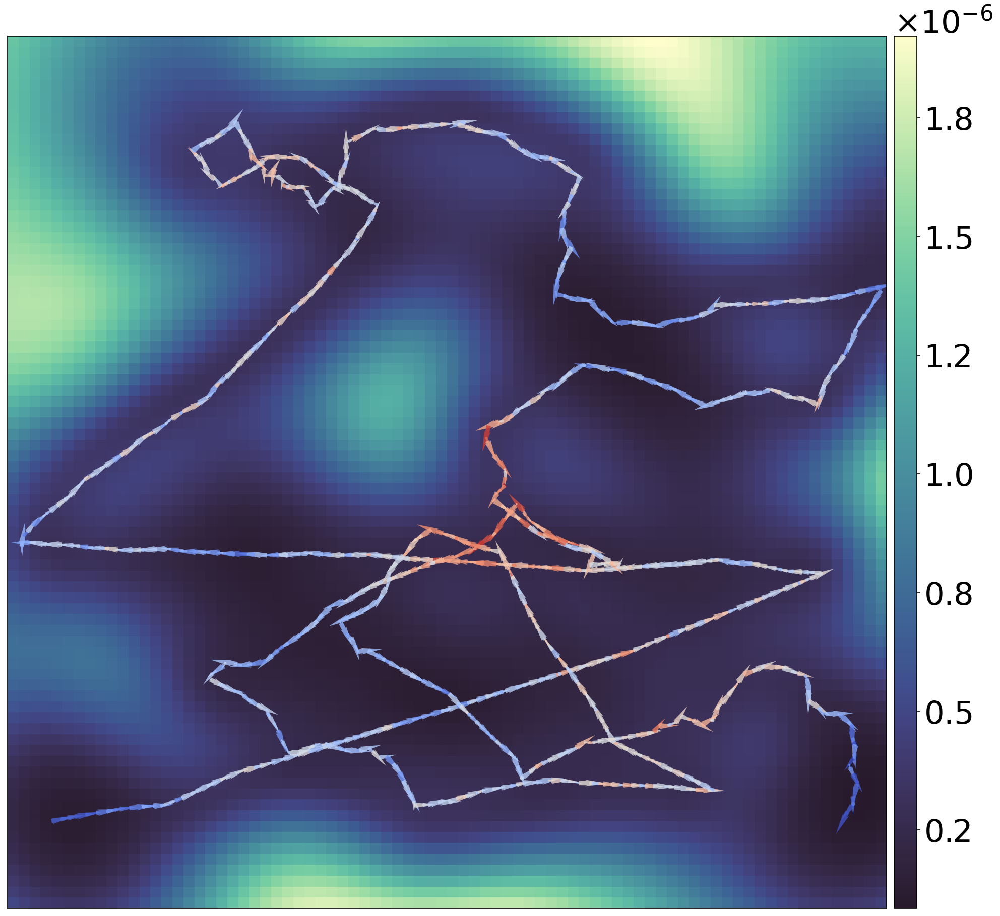

([-10.0, -9.75], [-6.75, -6.75])


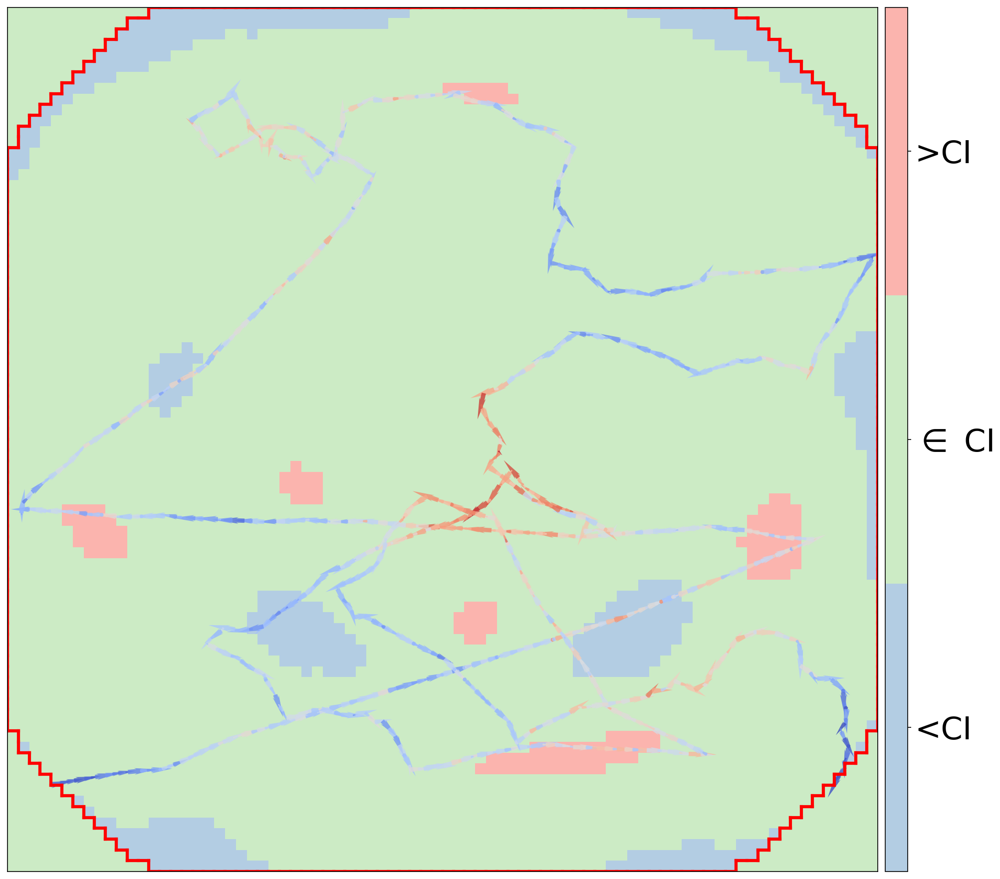

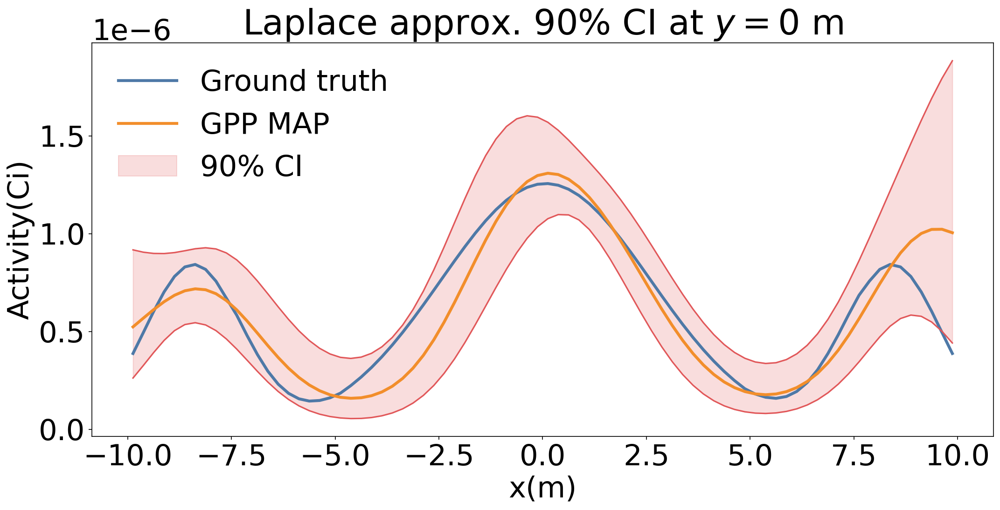

In [17]:
    draw_2D_img(scenario=CI_90_scenario,
                srcs = CI_90_scenario.srcs,
                show_counts_cbar=False,
                show_img_label_tick=False,
                cmap=cmo.deep_r,
                saveimg=True,
                cbar_label=None,
                fname=fig_dir + "/gsrc_gpp_optimal_sigma_lam_laplace_CI90.png"
               )

# bool_scenario.draw_img(
#     cmap=newcmp,
#     vmin=0,
#     vmax=1,
#     return_figure=True,
#     draw_contour=True,
#     contour_src=(gaussian_src+ring_gaussian_src).src_dist)
src = bool_scenario.srcs[0]
#src.src_dist[gaussian_src+ring_gaussian_src.src_dist==0] = np.nan
draw_2D_img(scenario=bool_scenario,
            srcs = [src],
            show_counts_cbar=False,
            show_img_label_tick=False,
            draw_contour=True,
            cmap=newcmp,        
            contour_src=(gaussian_src+ring_gaussian_src).src_dist,
            show_act_cbar=True,
            cbar_ticks=[0+(1/3/2), 1/2, 1-(1/3/2)],
            cbar_ticklabel=['<CI', r'$\in$ CI', '>CI'],
            saveimg=True,
            cbar_label=None,
            fname=fig_dir + "/gsrc_gpp_optimal_sigma_lam_laplace_boolmap.png"
           )

fig = plt.figure(figsize=(15,8))
plt.plot(
    y_ctr,
    true_dist[idx[0],:],
    lw=3,
    label="Ground truth",
    color=tab10[0])
plt.plot(
    y_ctr,
    recon_dist[idx[0],:],
    lw=3,
    label="GPP MAP",
    color=tab10[1])
plt.plot(
    y_ctr,
    QT95_dist[idx[0],:],
    color=tab10[2]
        )
plt.plot(
    y_ctr,
    QT05_dist[idx[0],:],
    color=tab10[2]
        )
plt.fill_between(
    y_ctr, 
    QT95_dist[idx[0],:], 
    QT05_dist[idx[0],:], 
    color=tab10[2], 
    label="90% CI", 
    alpha=0.2, 
#    step='pre'
)
plt.legend(loc='upper left')
plt.xlabel("x(m)")
plt.ylabel("Activity(Ci)")
plt.title(r"Laplace approx. 90% CI at $y=0$ m")
plt.tight_layout()
plt.savefig(fig_dir + "/gsrc_gpp_optimal_sigma_lam_laplace_slice.png", dpi=100, bbox_inches="tight")
plt.show()

KroneckerProduct(80 ⊗ 80 ⊗ 1)
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6400     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.99849D+04    |proj g|=  1.16115D+02

At iterate    5    f= -8.15727D+04    |proj g|=  2.73880D+01

At iterate   10    f= -8.21091D+04    |proj g|=  1.78216D+01


 This problem is unconstrained.



At iterate   15    f= -8.27050D+04    |proj g|=  1.61660D+01

At iterate   20    f= -8.40822D+04    |proj g|=  3.49994D+01

At iterate   25    f= -8.43568D+04    |proj g|=  1.71407D+01

At iterate   30    f= -8.46144D+04    |proj g|=  9.96587D+00

At iterate   35    f= -8.47887D+04    |proj g|=  9.04181D+00

At iterate   40    f= -8.48558D+04    |proj g|=  4.56575D+00

At iterate   45    f= -8.49679D+04    |proj g|=  5.91901D+00

At iterate   50    f= -8.50473D+04    |proj g|=  9.97467D+00

At iterate   55    f= -8.50841D+04    |proj g|=  2.98519D+00

At iterate   60    f= -8.51151D+04    |proj g|=  5.12788D+00

At iterate   65    f= -8.51336D+04    |proj g|=  2.98037D+00

At iterate   70    f= -8.51411D+04    |proj g|=  3.20570D+00

At iterate   75    f= -8.51472D+04    |proj g|=  3.38409D+00

At iterate   80    f= -8.51523D+04    |proj g|=  1.16850D+00

At iterate   85    f= -8.51567D+04    |proj g|=  2.05733D+00

At iterate   90    f= -8.51597D+04    |proj g|=  1.42055D+00

At iter

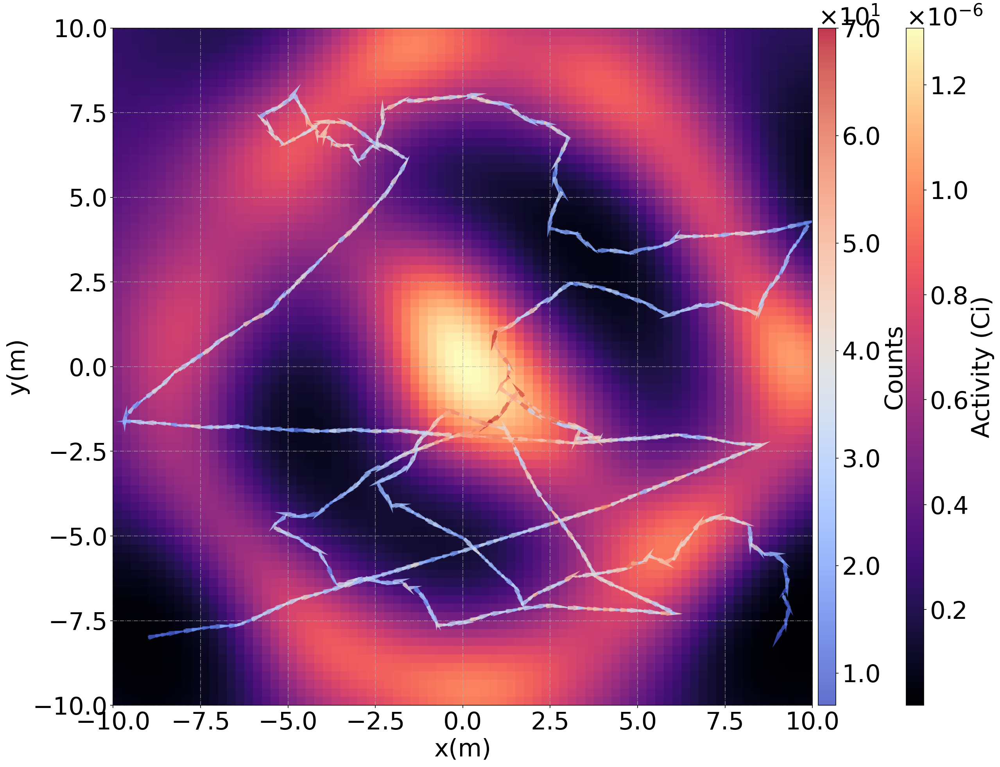

  0%|          | 0/999999 [00:00<?, ?it/s]

Acceptance probability : 0.337350

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337383

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337541

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337692

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337769

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337791

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337790

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337806

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337770

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337764

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337747

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337874

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337924

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337945

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337795

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337750

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337711

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337751

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337718

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337637

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337596

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337555

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337618

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337705

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337732

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337687

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337713

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337721

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337794

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Acceptance probability : 0.337887

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [18]:
# Perform pcn mcmc
mcmc_samples = test_imager.pcn_mcmc(beta=2.0e-2, n_samples=int(1e6), sigma=sigma, lam=lam, kronecker=True, cov_kernel="squared_exponential")

In [22]:
# Save the MCMC data
# os.mkdir("../data")
# np.save("../data/mcmc_samples.npy", mcmc_samples)
# mcmc_samples = np.load("../data/mcmc_samples.npy")

In [23]:
QT_05 = np.quantile(mcmc_samples[:, :], 0.05, axis=1)
QT_95 = np.quantile(mcmc_samples[:, :], 0.95, axis=1)
QT_05 = imager.imager.inv_link(lam=lam, xi=QT_05.reshape(-1,1), cov=test_imager.cov)
QT_95 = imager.imager.inv_link(lam=lam, xi=QT_95.reshape(-1,1), cov=test_imager.cov)

mean = np.mean(mcmc_samples[:,:], axis=-1)
MEAN = imager.imager.inv_link(lam=lam, xi=mean.reshape(-1,1), cov=test_imager.cov)

In [ ]:
#delete the samples to free memory
del(mcmc_samples)

In [24]:
np.save("../data/ring_gsrc_QT_05", QT_05)
np.save("../data/ring_gsrc_QT_90", QT_90)
np.save("../data/ring_gsrc_QT_95", QT_95)
np.save("../data/ring_gsrc_mean", MEAN)

In [25]:
QT_05 = np.load("../data/ring_gsrc_QT_05.npy")
QT_90 = np.load("../data/ring_gsrc_QT_90.npy")
QT_95 = np.load("../data/ring_gsrc_QT_95.npy")
MEAN = np.load("../data/ring_gsrc_mean.npy")

In [27]:

int_time=0.1

CI_90_img = imager.DistributedSource(src_str = (QT_95-QT_05).sum()/3.7e10,
                         src_dist=np.reshape((QT_95-QT_05), test_scenario.dims)/3.7e10)

QT_90_img = imager.DistributedSource(src_str = QT_90.sum()/3.7e10,
                         src_dist=np.reshape(QT_90, test_scenario.dims)/3.7e10)

QT_95_img = imager.DistributedSource(src_str = QT_95.sum()/3.7e10,
                         src_dist=np.reshape(QT_95, test_scenario.dims)/3.7e10)

QT_05_img = imager.DistributedSource(src_str = QT_05.sum()/3.7e10,
                         src_dist=np.reshape(QT_05, test_scenario.dims)/3.7e10)

CI_90_scenario = imager.Scenario(path=path,
                                extent = test_scenario.extent,
                                vox_size=test_scenario.vox_size,
                                srcs = [CI_90_img],
                                dets = [det],
                                int_time = int_time,
                                bkg=0)
QT_95_scenario = imager.Scenario(path=path,
                                extent = test_scenario.extent,
                                vox_size=test_scenario.vox_size,
                                srcs = [QT_95_img],
                                dets = [det],
                                int_time = int_time,
                                bkg=0)

QT_90_scenario = imager.Scenario(path=path,
                                extent = test_scenario.extent,
                                vox_size=test_scenario.vox_size,
                                srcs = [QT_90_img],
                                dets = [det],
                                int_time = int_time,
                                bkg=0)

QT_05_scenario = imager.Scenario(path=path,
                                extent = test_scenario.extent,
                                vox_size=test_scenario.vox_size,
                                srcs = [QT_05_img],
                                dets = [det],
                                int_time = int_time,
                                bkg=0)

CI_90_scenario.counts = test_scenario.counts


bool_map = np.ones((gaussian_src+ring_gaussian_src).src_dist.shape) * 0.5

bool_map[((gaussian_src+ring_gaussian_src).src_dist > 0) &\
         ((gaussian_src+ring_gaussian_src).src_dist*3.7e10 > QT_05.reshape(test_scenario.dims)) &\
         ((gaussian_src+ring_gaussian_src).src_dist*3.7e10 < QT_95.reshape(test_scenario.dims))] = 0.5

bool_map[((gaussian_src+ring_gaussian_src).src_dist > 0) &\
         ((gaussian_src+ring_gaussian_src).src_dist*3.7e10 > QT_95.reshape(test_scenario.dims))] = 1

bool_map[((gaussian_src+ring_gaussian_src).src_dist > 0) &\
         ((gaussian_src+ring_gaussian_src).src_dist*3.7e10 < QT_05.reshape(test_scenario.dims))] = 0



bool_img = imager.DistributedSource(src_str = bool_map.sum(),
                         src_dist=np.reshape(bool_map, test_scenario.dims))

bool_scenario = imager.Scenario(path=path,
                                extent = test_scenario.extent,
                                vox_size=test_scenario.vox_size,
                                srcs = [bool_img],
                                dets = [det],
                                int_time = 0.1,
                                bkg = 0)
bool_scenario.counts = test_scenario.counts


#step along the hoottest spot of the reconstructed img
true_dist = (gaussian_src+ring_gaussian_src).src_dist.reshape((gaussian_src+ring_gaussian_src).src_dist.shape[:2])
recon_dist = test_imager.recon_img.src_dist.reshape(test_imager.recon_img.src_dist.shape[:2])

QT95_dist = QT_95_img.src_dist.reshape(QT_95_img.src_dist.shape[:2])
QT05_dist = QT_05_img.src_dist.reshape(QT_05_img.src_dist.shape[:2])
x_ctr = test_scenario.x_ctr
y_ctr = test_scenario.y_ctr

#idx = np.unravel_index(recon_dist.argmax(), QT_05_img.src_dist.shape[:2])
idx_y = -0
idx_x = -0
idx = (np.argmin(np.abs(y_ctr-idx_y)), np.argmin(np.abs(x_ctr-idx_x)))


1it [00:00, 776.44it/s]
1it [00:00, 161.63it/s]
1it [00:00, 291.82it/s]
1it [00:00, 990.86it/s]
1it [00:00, 184.91it/s]


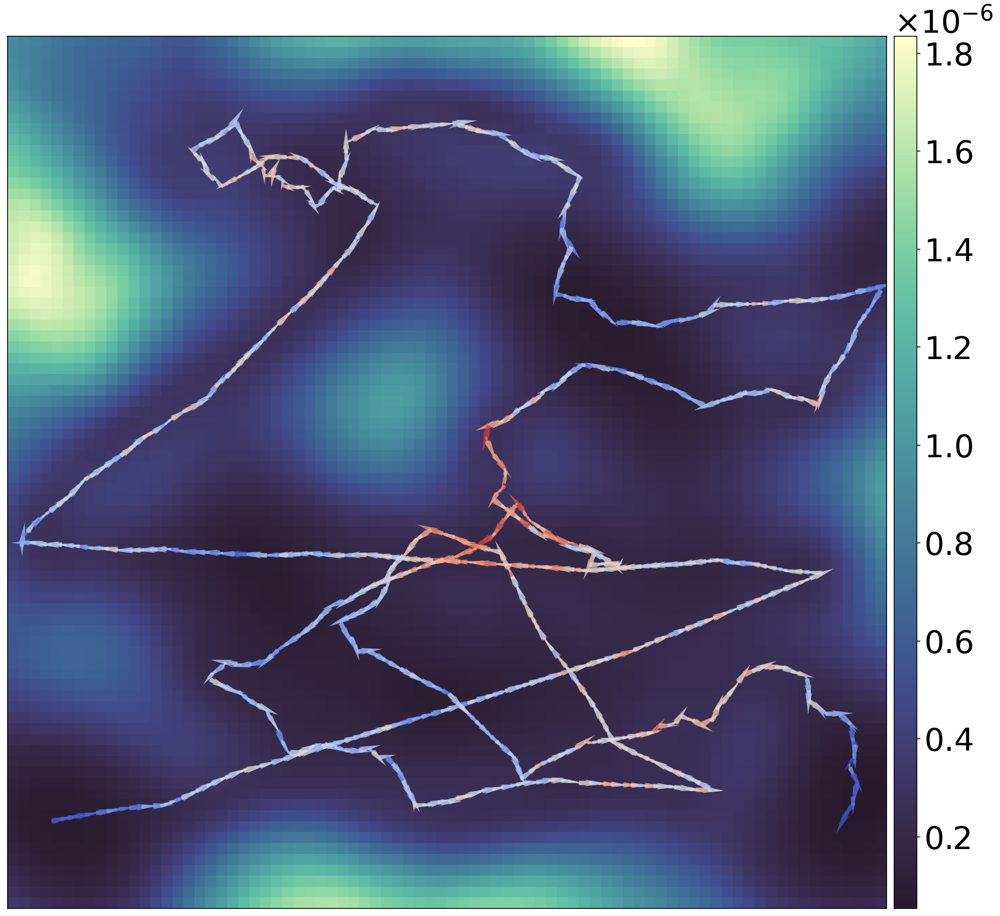

([-10.0, -9.75], [-6.75, -6.75])


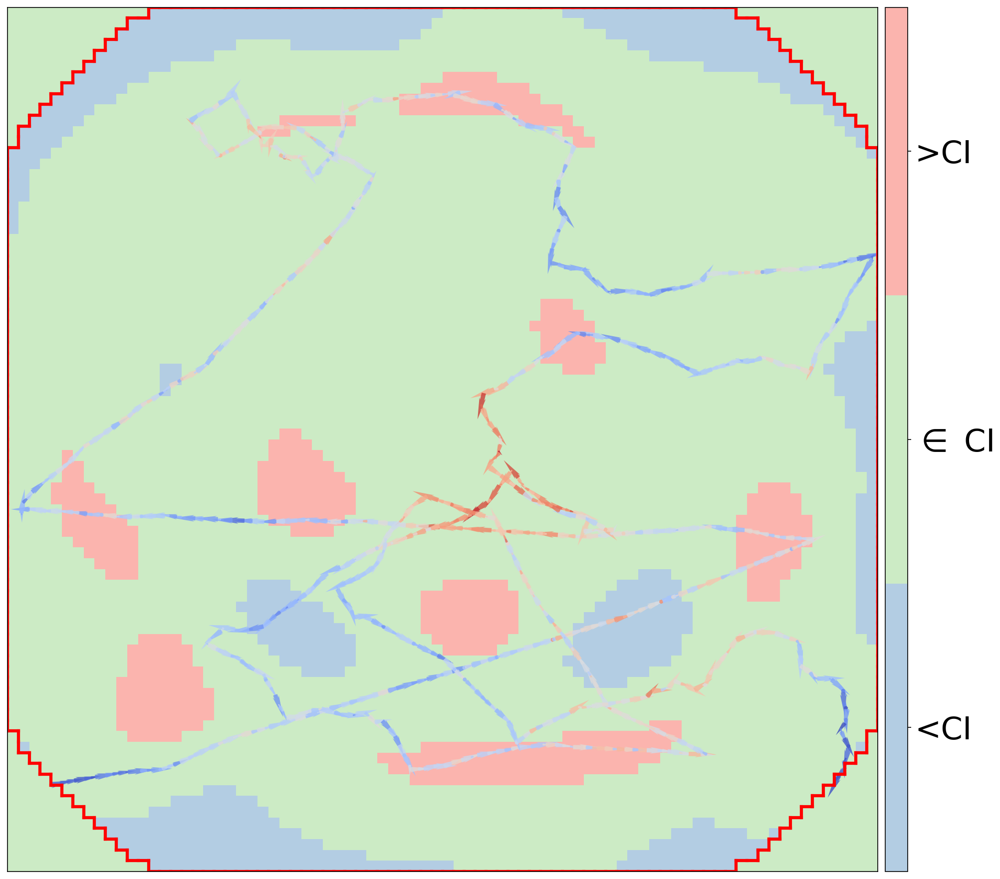

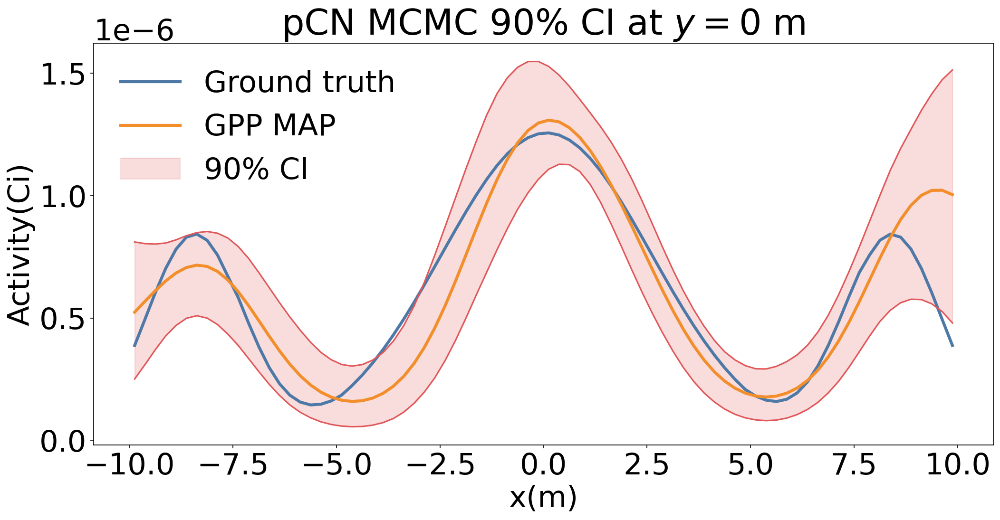

In [28]:
draw_2D_img(scenario=CI_90_scenario,
            srcs = CI_90_scenario.srcs,
            show_counts_cbar=False,
            show_img_label_tick=False,
            cmap=cmo.deep_r,
            saveimg=True,
            cbar_label=None,
            fname="../fig/gsrc_gpp_optimal_sigma_lam_pcn_CI90.png"
           )

# bool_scenario.draw_img(
#     cmap=newcmp,
#     vmin=0,
#     vmax=1,
#     return_figure=True,
#     draw_contour=True,
#     contour_src=(gaussian_src+ring_gaussian_src).src_dist)
src = bool_scenario.srcs[0]
#src.src_dist[gaussian_src+ring_gaussian_src.src_dist==0] = np.nan
draw_2D_img(scenario=bool_scenario,
            srcs = [src],
            show_counts_cbar=False,
            show_img_label_tick=False,
            draw_contour=True,
            cmap=newcmp,        
            contour_src=(gaussian_src+ring_gaussian_src).src_dist,
            show_act_cbar=True,
            saveimg=True,
            cbar_label=None,
            cbar_ticks=[0+(1/3/2), 1/2, 1-(1/3/2)],
            cbar_ticklabel=['<CI', r'$\in$ CI', '>CI'],
            fname="../fig/gsrc_gpp_optimal_sigma_lam_pcn_boolmap.png"
           )

fig = plt.figure(figsize=(15,8))
plt.plot(
    y_ctr,
    true_dist[idx[0],:],
    lw=3,
    label="Ground truth",
    color=tab10[0])
plt.plot(
    y_ctr,
    recon_dist[idx[0],:],
    lw=3,
    label="GPP MAP",
    color=tab10[1])
plt.plot(
    y_ctr,
    QT95_dist[idx[0],:],
    color=tab10[2]
        )
plt.plot(
    y_ctr,
    QT05_dist[idx[0],:],
    color=tab10[2]
        )
plt.fill_between(
    y_ctr, 
    QT95_dist[idx[0],:], 
    QT05_dist[idx[0],:], 
    color=tab10[2], 
    label="90% CI", 
    alpha=0.2, 
#    step='pre'
)
plt.legend(loc='upper left')
plt.xlabel("x(m)")
plt.ylabel("Activity(Ci)")
plt.title(r"pCN MCMC 90% CI at $y=0$ m")
plt.tight_layout()
plt.savefig("../fig/gsrc_gpp_optimal_sigma_lam_pcn_slice.png", dpi=100, bbox_inches="tight")
plt.show()